# CM1

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from scipy.stats import kurtosis
from scipy.stats import skew
from scipy import mean
from scipy import stats
import seaborn as sns
from IPython.display import display, Math, Latex
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
from collections import Counter
from sklearn.decomposition import PCA
import altair as alt
from sklearn import tree
from matplotlib.cbook import boxplot_stats

from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score

from sklearn.preprocessing import OneHotEncoder

In [3]:
#creating dataframe for camparison in CM7
df_interpretability_confirmed=pd.DataFrame(columns=['Accuracy','AUC', 'F1-Score'],index=['Decision Trees Classifier','Random Forest Classifier','Gradient Tree Boosting','Naive Bayes'])
df_interpretability_deaths=pd.DataFrame(columns=['Accuracy','AUC', 'F1-Score'],index=['Decision Trees Classifier','Random Forest Classifier','Gradient Tree Boosting','Naive Bayes'])
df_interpretability_recovered=pd.DataFrame(columns=['Accuracy','AUC', 'F1-Score'],index=['Decision Trees Classifier','Random Forest Classifier','Gradient Tree Boosting','Naive Bayes'])

In [4]:
#Loading dataset
df = pd.read_csv('dkmacovid_train.csv')
df.shape

(1380, 17)

In [5]:
#exploring data
df.head(10)

,Day,State ID,State,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio,Confirmed,Deaths,Recovered
0,2,1,Alabama,32.3182,-86.9023,162449,7535.061394,1891468,1.318688,38576.31315,"5,024,279",99.2,29,94,True,False,False
1,2,2,Alaska,61.3707,-152.4044,40421,6534.252848,1290349,0.449781,176386.82510,"733,391",1.3,52,109,True,True,False
2,2,3,Arizona,33.7298,-111.4312,452222,7407.212013,5218721,1.680608,39916.14181,"7,151,502",62.9,35,99,True,True,True
3,2,4,Arkansas,34.9697,-92.3731,24012,7669.219075,2079788,1.611203,68917.26567,"3,011,524",57.9,36,96,True,True,True
4,2,5,California,36.1162,-119.6816,2362015,6045.109130,33391442,1.111215,84509.14544,"39,538,223",253.7,13,99,True,True,False
5,2,6,Colorado,39.0598,-105.3111,316043,5889.695239,4474747,1.448233,77703.63149,"5,773,714",55.7,39,101,True,True,True
6,2,7,Connecticut,41.5978,-72.7554,174221,5332.530032,4383361,3.207974,122945.53010,"3,605,944",744.7,6,95,True,True,False
7,2,8,Delaware,39.3185,-75.5071,39092,6045.920778,991318,1.579671,101802.69550,"989,948",508,8,94,True,True,False
8,2,9,District of Columbia,38.8974,-77.0268,7715,4181.231571,911378,2.683927,129136.27930,"689,545","11,280.00",1,96,True,True,True
9,2,10,Florida,27.7663,-81.6868,1332943,6308.080782,15950750,1.615697,74266.43692,"21,538,187",401.4,10,96,True,True,False


### Checking for NA values

<p>In this section we check if any missing value is present in our code. This is done using .isnull function. Incase we find any null values we will deal with using different techniques like interpolation</p>

In [6]:
df.isnull().sum()

Day                                0
State ID                           0
State                              0
Lat                                0
Long_                              0
Active                             0
Incident_Rate                      0
Total_Test_Results                 0
Case_Fatality_Ratio                0
Testing_Rate                       0
Resident Population 2020 Census    0
Population Density 2020 Census     0
Density Rank 2020 Census           0
SexRatio                           0
Confirmed                          0
Deaths                             0
Recovered                          0
dtype: int64

No Null value is present that means our dataset is complete

In [7]:
df.shape

(1380, 17)

In [8]:
df.head(10)

,Day,State ID,State,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio,Confirmed,Deaths,Recovered
0,2,1,Alabama,32.3182,-86.9023,162449,7535.061394,1891468,1.318688,38576.31315,"5,024,279",99.2,29,94,True,False,False
1,2,2,Alaska,61.3707,-152.4044,40421,6534.252848,1290349,0.449781,176386.82510,"733,391",1.3,52,109,True,True,False
2,2,3,Arizona,33.7298,-111.4312,452222,7407.212013,5218721,1.680608,39916.14181,"7,151,502",62.9,35,99,True,True,True
3,2,4,Arkansas,34.9697,-92.3731,24012,7669.219075,2079788,1.611203,68917.26567,"3,011,524",57.9,36,96,True,True,True
4,2,5,California,36.1162,-119.6816,2362015,6045.109130,33391442,1.111215,84509.14544,"39,538,223",253.7,13,99,True,True,False
5,2,6,Colorado,39.0598,-105.3111,316043,5889.695239,4474747,1.448233,77703.63149,"5,773,714",55.7,39,101,True,True,True
6,2,7,Connecticut,41.5978,-72.7554,174221,5332.530032,4383361,3.207974,122945.53010,"3,605,944",744.7,6,95,True,True,False
7,2,8,Delaware,39.3185,-75.5071,39092,6045.920778,991318,1.579671,101802.69550,"989,948",508,8,94,True,True,False
8,2,9,District of Columbia,38.8974,-77.0268,7715,4181.231571,911378,2.683927,129136.27930,"689,545","11,280.00",1,96,True,True,True
9,2,10,Florida,27.7663,-81.6868,1332943,6308.080782,15950750,1.615697,74266.43692,"21,538,187",401.4,10,96,True,True,False


### Checking for Duplicate rows

<p>In this section we check if there are any duplicate rows present in our dataset. Duplicate rows cause the problem of data leakage. This is done using '.duplicated()' function. </p>

In [9]:
duplicate_rows=df.duplicated().sum()
#if duplicate_rows=0 means no duplicate rows present
print(duplicate_rows)

0


In [10]:
df.dtypes

Day                                  int64
State ID                             int64
State                               object
Lat                                float64
Long_                              float64
Active                               int64
Incident_Rate                      float64
Total_Test_Results                   int64
Case_Fatality_Ratio                float64
Testing_Rate                       float64
Resident Population 2020 Census     object
Population Density 2020 Census      object
Density Rank 2020 Census             int64
SexRatio                             int64
Confirmed                             bool
Deaths                                bool
Recovered                             bool
dtype: object

### Converting Object to float and removing ','

<p>On using '.dtypes' we find out that features like 'Resident Population 2020 Census' and 'Population Density 2020 Census' are of object type whereas they should be of numeric type so we change its datatype.</p>

In [11]:
df["Resident Population 2020 Census"] = df["Resident Population 2020 Census"].str.replace(",","").astype(float)
df["Population Density 2020 Census"] = df["Population Density 2020 Census"].str.replace(",","").astype(float)
df.head()

,Day,State ID,State,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio,Confirmed,Deaths,Recovered
0,2,1,Alabama,32.3182,-86.9023,162449,7535.061394,1891468,1.318688,38576.31315,5024279.0,99.2,29,94,True,False,False
1,2,2,Alaska,61.3707,-152.4044,40421,6534.252848,1290349,0.449781,176386.82510,733391.0,1.3,52,109,True,True,False
2,2,3,Arizona,33.7298,-111.4312,452222,7407.212013,5218721,1.680608,39916.14181,7151502.0,62.9,35,99,True,True,True
3,2,4,Arkansas,34.9697,-92.3731,24012,7669.219075,2079788,1.611203,68917.26567,3011524.0,57.9,36,96,True,True,True
4,2,5,California,36.1162,-119.6816,2362015,6045.109130,33391442,1.111215,84509.14544,39538223.0,253.7,13,99,True,True,False


In [12]:
df.dtypes

Day                                  int64
State ID                             int64
State                               object
Lat                                float64
Long_                              float64
Active                               int64
Incident_Rate                      float64
Total_Test_Results                   int64
Case_Fatality_Ratio                float64
Testing_Rate                       float64
Resident Population 2020 Census    float64
Population Density 2020 Census     float64
Density Rank 2020 Census             int64
SexRatio                             int64
Confirmed                             bool
Deaths                                bool
Recovered                             bool
dtype: object

### Converting True to 1 and False to 0. See Below.

In [13]:
from sklearn.preprocessing import LabelBinarizer
le = LabelBinarizer()
df['Confirmed'] = le.fit_transform(df['Confirmed'])
df['Deaths'] = le.fit_transform(df['Deaths'])
df['Recovered'] = le.fit_transform(df['Recovered'])
df.head(20)

,Day,State ID,State,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio,Confirmed,Deaths,Recovered
0,2,1,Alabama,32.3182,-86.9023,162449,7535.061394,1891468,1.318688,38576.31315,5024279.0,99.2,29,94,1,0,0
1,2,2,Alaska,61.3707,-152.4044,40421,6534.252848,1290349,0.449781,176386.82510,733391.0,1.3,52,109,1,1,0
2,2,3,Arizona,33.7298,-111.4312,452222,7407.212013,5218721,1.680608,39916.14181,7151502.0,62.9,35,99,1,1,1
3,2,4,Arkansas,34.9697,-92.3731,24012,7669.219075,2079788,1.611203,68917.26567,3011524.0,57.9,36,96,1,1,1
4,2,5,California,36.1162,-119.6816,2362015,6045.109130,33391442,1.111215,84509.14544,39538223.0,253.7,13,99,1,1,0
5,2,6,Colorado,39.0598,-105.3111,316043,5889.695239,4474747,1.448233,77703.63149,5773714.0,55.7,39,101,1,1,1
6,2,7,Connecticut,41.5978,-72.7554,174221,5332.530032,4383361,3.207974,122945.53010,3605944.0,744.7,6,95,1,1,0
7,2,8,Delaware,39.3185,-75.5071,39092,6045.920778,991318,1.579671,101802.69550,989948.0,508.0,8,94,1,1,0
8,2,9,District of Columbia,38.8974,-77.0268,7715,4181.231571,911378,2.683927,129136.27930,689545.0,11280.0,1,96,1,1,1
9,2,10,Florida,27.7663,-81.6868,1332943,6308.080782,15950750,1.615697,74266.43692,21538187.0,401.4,10,96,1,1,0


### Outlier Detection

<p>In this section we deal with outliers in the dataset. We use different kinds of visualizations to check for outliers. For some features we detect the outliers based on the state and for some other features we do that based on the whole dataset.<p>

In [14]:
df.nunique()

Day                                  30
State ID                             46
State                                46
Lat                                  46
Long_                                46
Active                             1329
Incident_Rate                      1326
Total_Test_Results                 1293
Case_Fatality_Ratio                1326
Testing_Rate                       1293
Resident Population 2020 Census      46
Population Density 2020 Census       46
Density Rank 2020 Census             46
SexRatio                             12
Confirmed                             2
Deaths                                2
Recovered                             2
dtype: int64

#### Since values of Active, Incident_Rate, Total_Test_Results, Case_Fatality_Ratio, Testing_Rate change daily and the outliers of these features depend on the state (for example a high number of active cases can be an outlier for one state but normal to another state). So we detect the outliers of there columns statewise and not for the whole dataset. We use two different types of plots to visualize these above given features for each state from 2-Jan-2021 to 31-jan-2021. These types are CIrcle chart plotted with the help of Altair library and 'Day ' vs 'Feature' Lineplot for each State. 

#### Active

In [15]:
alt.Chart(df).mark_circle().encode(
    x='Day:O',
    y='State',
    color='State',
    size=alt.Size('Active:Q',
        scale=alt.Scale(range=[0, 1000]),
        legend=alt.Legend(title='Active Cases')
    ) 
).properties(
    width=800,
    height=600,
    title="Active Cases for each State"

)

alt.Chart(...)

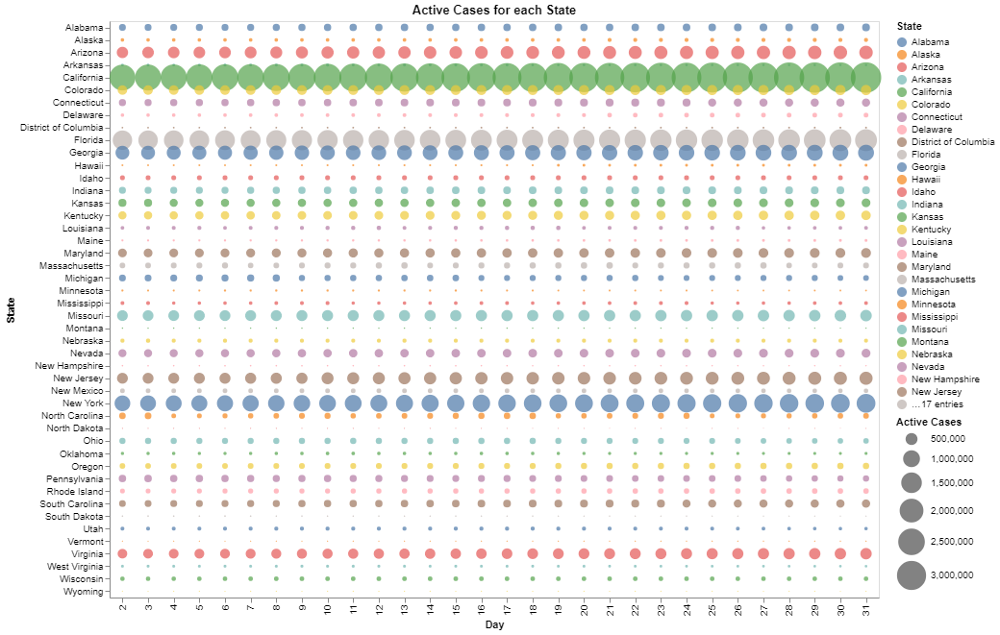

In [322]:
from PIL import Image
# since latex doesn not support plots generated by altair therefore we are storing them and importing them using image for report 
img = Image.open("visualization.png")
img

<p> from the above plot we can see that the size of the circle is almost same for each state on every consecutive day which means that the number of active cases remain in the same range and are not increased or decreased suddenly which means there is no outlier. </p>

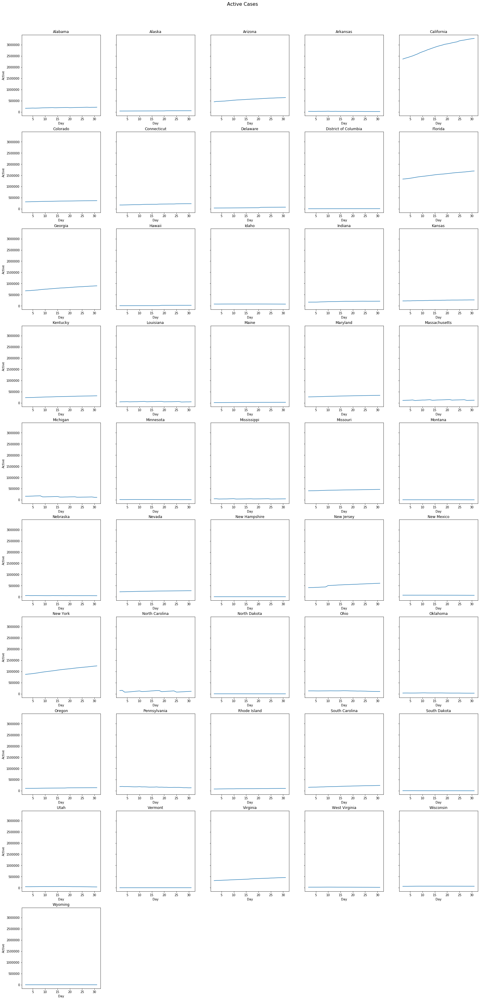

In [16]:
States=df.State.unique()
fig, axes = plt.subplots(10,5, figsize=(27, 50), sharey=True)
fig.suptitle('Active Cases', y=1.03, fontsize=16)
fig.subplots_adjust(top=1)
k=0
for j in range(0,10):
    for i in range(0,5):
        if(k>45):
            fig.delaxes(axes[j][i])
            k=k+1
            continue
        sns.lineplot(data=df.loc[df['State'] == States[k]],x='Day',y='Active',ax=axes[j,i]).set(title=States[k])
        k=k+1


<p> Lineplots for each state follow a linear fashion they either follow an increasing trend i.e number of active cases increasing or steady trend in which the number of cases are roughly the same. Since no Peaks are visible in this plot hence there are no outliers in feature ' Active'.</p>

#### Incident_Rate

In [17]:
alt.Chart(df).mark_circle().encode(
    x='Day:O',
    y='State',
    color='State',
    size=alt.Size('Incident_Rate:Q',
        scale=alt.Scale(range=[0, 1000]),
        legend=alt.Legend(title='Incident_Rate')
    ) 
).properties(
    width=800,
    height=1000,
    title="Incident_Rate for each State"
)

alt.Chart(...)

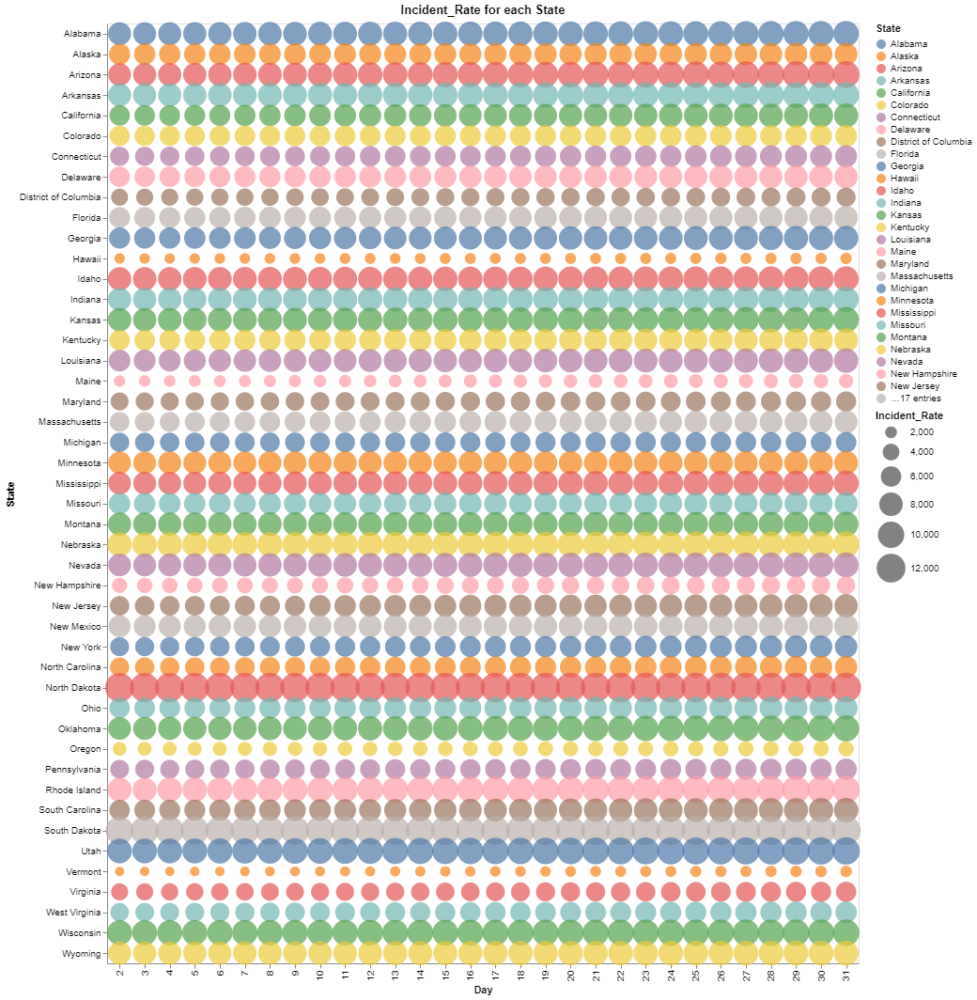

In [323]:
img = Image.open("visualization (4).png")
img

<p> from the above plot we can see that the size of the circle is almost same for each state on every consecutive day which means that the number of 'incident rate' remain in the same range and are not increased or decreased suddenly which means there is no outlier. </p>

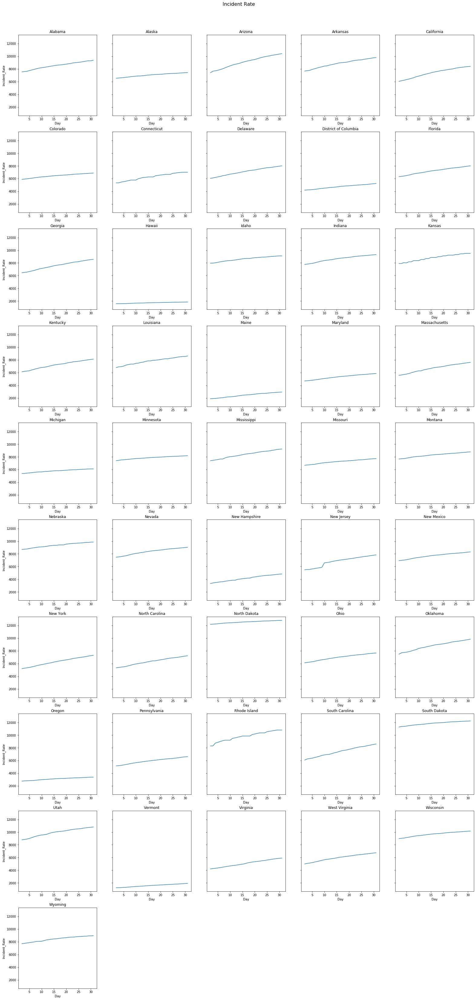

In [18]:
States=df.State.unique()
fig, axes = plt.subplots(10,5, figsize=(27, 50), sharey=True)
fig.suptitle('Incident Rate', y=1.03, fontsize=16)
fig.subplots_adjust(top=1)
k=0
for j in range(0,10):
    for i in range(0,5):
        if(k>45):
            fig.delaxes(axes[j][i])
            k=k+1
            continue
        sns.lineplot(data=df.loc[df['State'] == States[k]],x='Day',y='Incident_Rate',ax=axes[j,i]).set(title=States[k])
        k=k+1

<p> Lineplots for each state follow a linear fashion they either follow an increasing trend i.e number of active cases increasing or steady trend in which the number of cases are roughly the same. Since no Peaks are visible in this plot hence there are no outliers in feature ' Incident Rate'.</p>

#### Total Test Results

In [19]:
alt.Chart(df).mark_circle().encode(
    x='Day:O',
    y='State',
    color='State',
    size=alt.Size('Total_Test_Results:Q',
        scale=alt.Scale(range=[0, 1000]),
        legend=alt.Legend(title='Total Test Results')
    ) 
).properties(
    width=800,
    height=600,
    title="Total Test Results for each State"
)

alt.Chart(...)

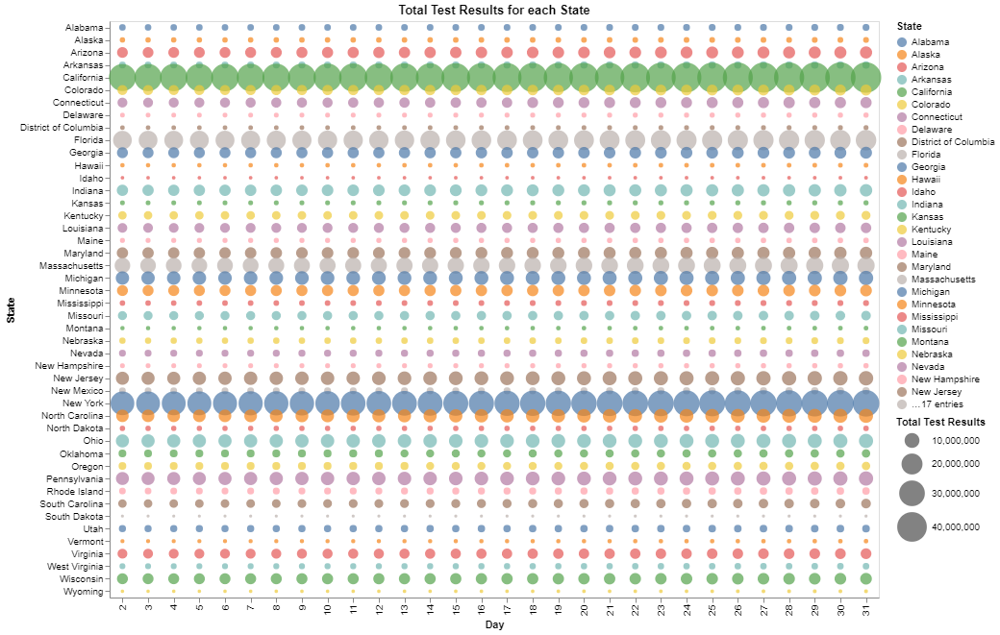

In [324]:
img = Image.open("visualization (1).png")
img

<p> from the above plot we can see that the size of the circle is almost same for each state on every consecutive day which means that the number of 'Total_Test_results' remain in the same range and are not increased or decreased suddenly which means there is no outlier. </p>

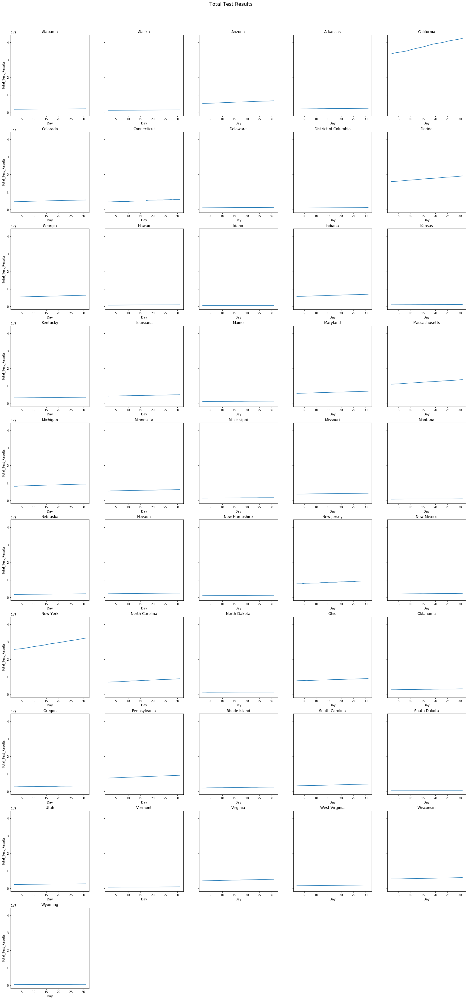

In [20]:
States=df.State.unique()
fig, axes = plt.subplots(10,5, figsize=(27, 50), sharey=True)
fig.suptitle('Total Test Results', y=1.03, fontsize=16)
fig.subplots_adjust(top=1)
k=0
for j in range(0,10):
    for i in range(0,5):
        if(k>45):
            fig.delaxes(axes[j][i])
            k=k+1
            continue
        sns.lineplot(data=df.loc[df['State'] == States[k]],x='Day',y='Total_Test_Results',ax=axes[j,i]).set(title=States[k])
        k=k+1

<p> Lineplots for each state follow a linear fashion they either follow an increasing trend i.e number of active cases increasing or steady trend in which the number of cases are roughly the same. Since no Peaks are visible in this plot hence there are no outliers in feature ' Total Test Results'.</p>

#### Case Fatality Ratio 

In [21]:
alt.Chart(df).mark_circle().encode(
    x='Day:O',
    y='State',
    color='State',
    size=alt.Size('Case_Fatality_Ratio:Q',
        scale=alt.Scale(range=[0, 1000]),
        legend=alt.Legend(title='Case Fatality Ratio')
    ) 
).properties(
    width=800,
    height=1000,
    title="Case Fatality Ratio for each State"
)

alt.Chart(...)

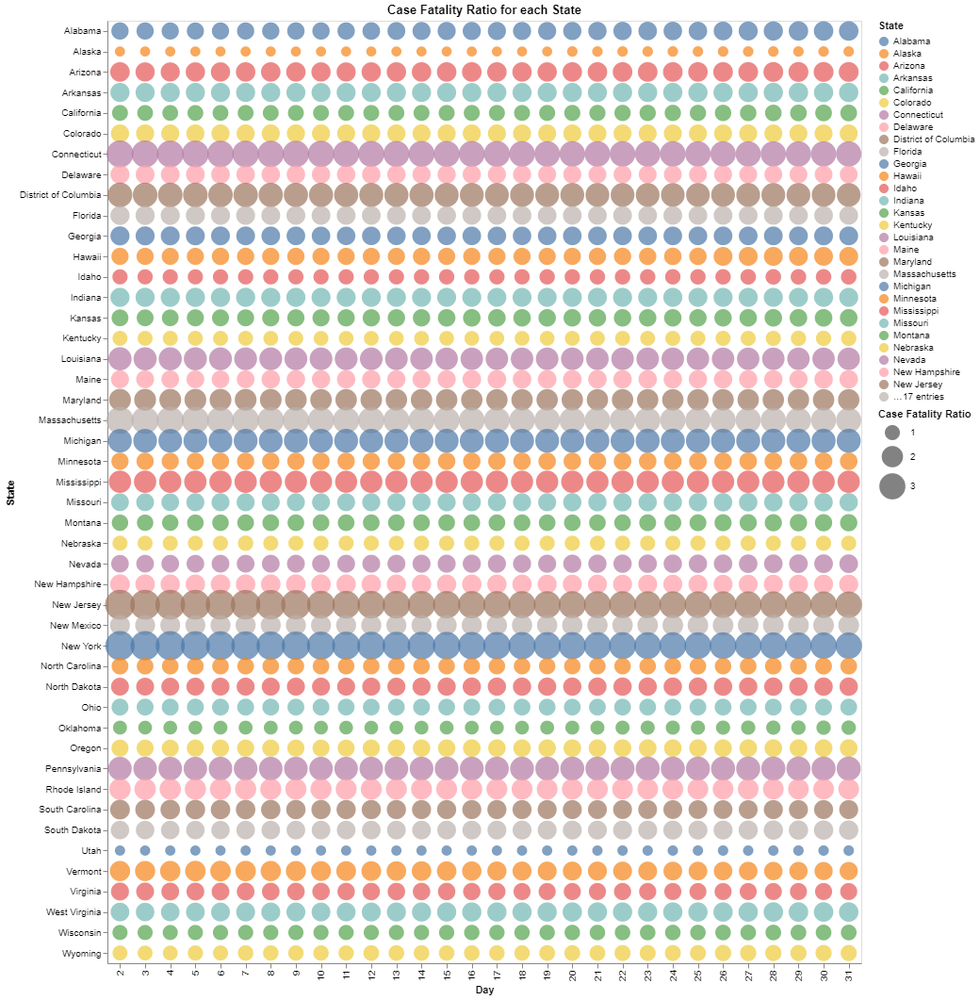

In [325]:
img = Image.open("visualization (2).png")
img

<p> from the above plot we can see that the size of the circle is almost same for each state on every consecutive day which means that the number of 'case fatility ratio' remain in the same range and are not increased or decreased suddenly which means there is no outlier. </p>

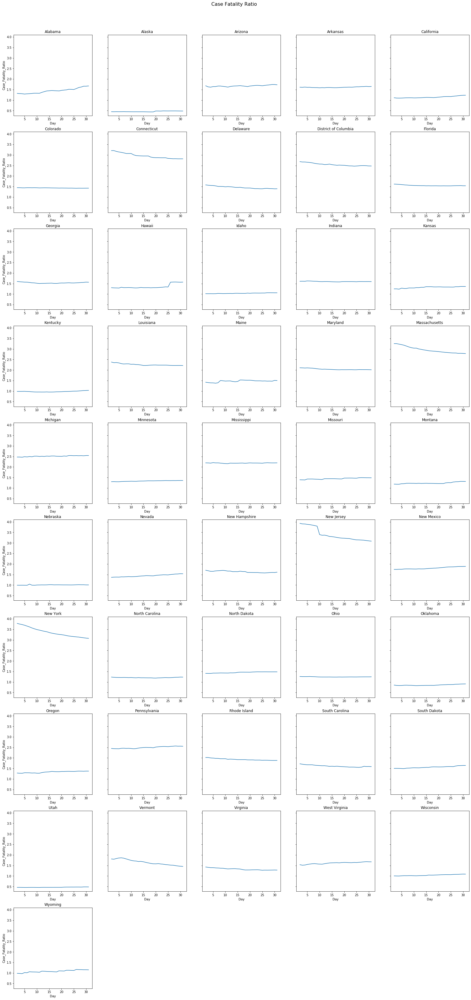

In [22]:
States=df.State.unique()
fig, axes = plt.subplots(10,5, figsize=(27, 50), sharey=True)
fig.suptitle('Case Fatality Ratio', y=1.03, fontsize=16)
fig.subplots_adjust(top=1)
k=0
for j in range(0,10):
    for i in range(0,5):
        if(k>45):
            fig.delaxes(axes[j][i])
            k=k+1
            continue
        sns.lineplot(data=df.loc[df['State'] == States[k]],x='Day',y='Case_Fatality_Ratio',ax=axes[j,i]).set(title=States[k])
        k=k+1

<p> Lineplots for each state follow a linear fashion they either follow an increasing trend i.e number of active cases increasing or steady trend in which the number of cases are roughly the same. Since no Peaks are visible in this plot hence there are no outliers in feature ' Case Fatility Ratio'.</p>

#### Testing Rate 

In [23]:
alt.Chart(df).mark_circle().encode(
    x='Day:O',
    y='State',
    color='State',
    size=alt.Size('Testing_Rate:Q',
        scale=alt.Scale(range=[0, 1000]),
        legend=alt.Legend(title='Testing Rate')
    ) 
).properties(
    width=800,
    height=1000,
    title="Testing Rate for each State"
)

alt.Chart(...)

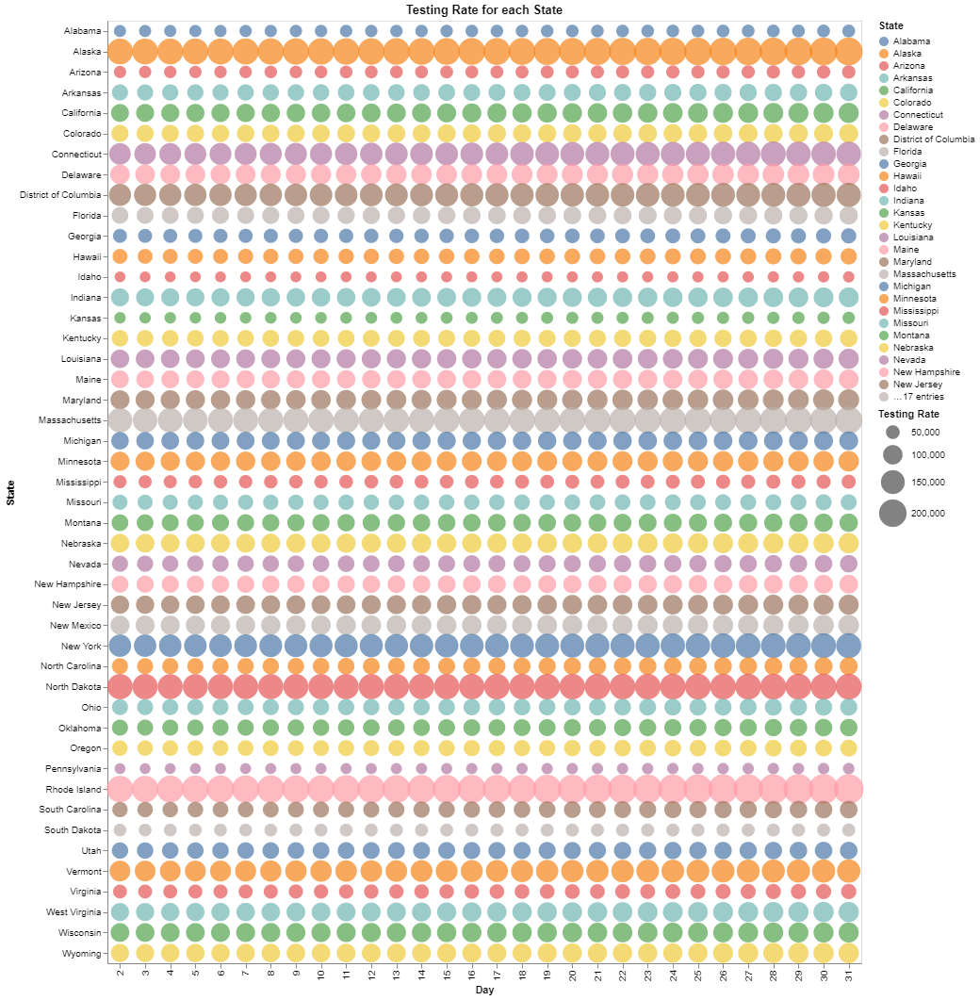

In [326]:
img = Image.open("visualization (3).png")
img

<p> from the above plot we can see that the size of the circle is almost same for each state on every consecutive day which means that the number of 'Testing rate' remain in the same range and are not increased or decreased suddenly which means there is no outlier. </p>

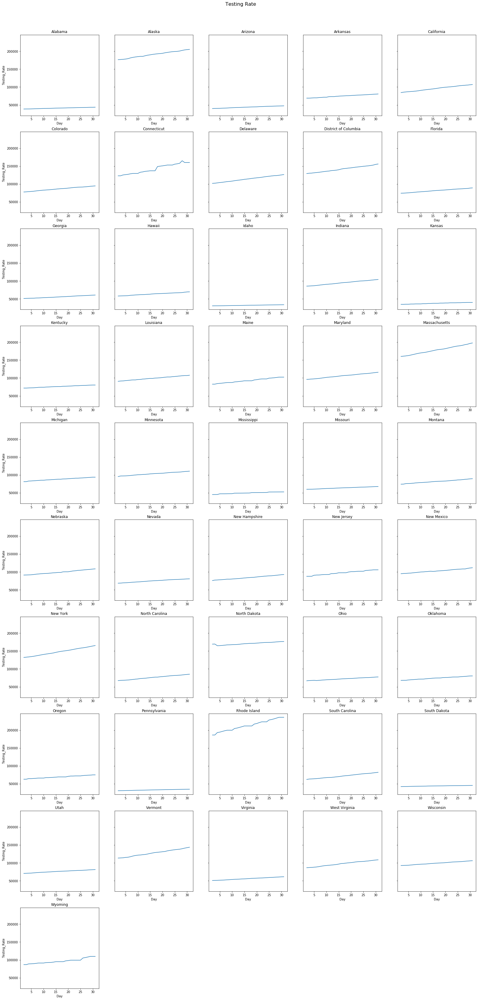

In [24]:
States=df.State.unique()
fig, axes = plt.subplots(10,5, figsize=(27, 50), sharey=True)
fig.suptitle('Testing Rate', y=1.03, fontsize=16)
fig.subplots_adjust(top=1)
k=0
for j in range(0,10):
    for i in range(0,5):
        if(k>45):
            fig.delaxes(axes[j][i])
            k=k+1
            continue
        sns.lineplot(data=df.loc[df['State'] == States[k]],x='Day',y='Testing_Rate',ax=axes[j,i]).set(title=States[k])
        k=k+1

<p> Lineplots for each state follow a linear fashion they either follow an increasing trend i.e number of active cases increasing or steady trend in which the number of cases are roughly the same. Since no Peaks are visible in this plot hence there are no outliers in feature ' Testing Rate'.</p>

#### some features like Lat, Long_ , Resident Population 2020 Census , Population Density 2020 Census, have fixed value for a state therefore the outliers for them can be detected using the boxplot on the whole dataset and for a specific State

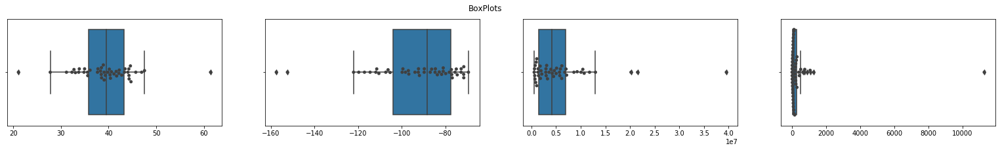

In [25]:
fig, axes = plt.subplots(1, 4, figsize=(27, 3), sharey=True)
fig.suptitle('BoxPlots')

sns.boxplot(x=df['Lat'].unique(), ax=axes[0])
sns.swarmplot(x=df['Lat'].unique(), color=".25", ax=axes[0])
Lat_outliers = [y for stat in boxplot_stats(df['Lat'].unique()) for y in stat['fliers']]

sns.boxplot(x=df['Long_'].unique(),ax=axes[1])
sns.swarmplot(x=df['Long_'].unique(), color=".25", ax=axes[1])
Long_outliers = [y for stat in boxplot_stats(df['Long_'].unique()) for y in stat['fliers']]

sns.boxplot(x=df['Resident Population 2020 Census'].unique(), ax=axes[2])
sns.swarmplot(x=df['Resident Population 2020 Census'].unique(), color=".25", ax=axes[2])
Pop_Den_outliers = [y for stat in boxplot_stats(df['Population Density 2020 Census'].unique()) for y in stat['fliers']]

sns.boxplot(x=df['Population Density 2020 Census'].unique(), ax=axes[3])
sns.swarmplot(x=df['Population Density 2020 Census'].unique(), color=".25", ax=axes[3])
Res_Pop_outliers = [y for stat in boxplot_stats(df['Resident Population 2020 Census'].unique()) for y in stat['fliers']]



In [26]:
print("Latitude Outlier States ")
for i in Lat_outliers:
    print(df["State"].loc[df['Lat']==i].unique())
    
print("Longitude Outlier States ")
for j in Long_outliers:
    print(df["State"].loc[df['Long_']==j].unique())


Latitude Outlier States 
['Hawaii']
['Alaska']
Longitude Outlier States 
['Alaska']
['Hawaii']


<p> For 'Lat'and 'Long_' we get hawaii and Alaska as the outliers. But they are not outliers since they are not connected to America and hence can be ignored.</p>

In [27]:
print("Population Density 2020 Census Outliers")
for i in Pop_Den_outliers:
    print(df["State"].loc[df['Population Density 2020 Census']==i].unique())
    
print("Resident Population 2020 Census Outliers")
for j in Res_Pop_outliers:
    print(df["State"].loc[df['Resident Population 2020 Census']==j].unique())


Population Density 2020 Census Outliers
['Connecticut']
['District of Columbia']
['Maryland']
['Massachusetts']
['New Jersey']
['Rhode Island']
Resident Population 2020 Census Outliers
['California']
['Florida']
['New York']


<p>The above printed States are the outliers for 'Population Density 2020 Census' and 'Resident Population 2020 Census'. But These states do have more Resident Populations and Population Density but thats because of other reasons and are not outliers

### Dropping Columns

<p>The columns that we drop are 'State' and 'State_ID', the reason for dropping these are that they are not relevant to the current prediction problem. The name of 'State' doesnt have any effect on the target also the 'State_ID' is just numbering of the States alphabetically which does not impact the Target label, therefore they are dropped. We divide our orignal dataset into three dataframes, one for each target label i.e confirmed, deaths and recovered. </p>

In [28]:
df_confirmed = df.drop(['State', 'State ID','Deaths', 'Recovered'], axis = 1)
df_deaths = df.drop(['State', 'State ID','Confirmed', 'Recovered'], axis = 1)
df_recovered = df.drop(['State', 'State ID','Deaths', 'Confirmed'], axis = 1)

df_onlyFeatures = df.drop(['State', 'State ID', 'Deaths', 'Confirmed','Recovered'], axis = 1)

In [29]:
df_onlyFeatures

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio
0,2,32.3182,-86.9023,162449,7535.061394,1891468,1.318688,38576.31315,5024279.0,99.2,29,94
1,2,61.3707,-152.4044,40421,6534.252848,1290349,0.449781,176386.82510,733391.0,1.3,52,109
2,2,33.7298,-111.4312,452222,7407.212013,5218721,1.680608,39916.14181,7151502.0,62.9,35,99
3,2,34.9697,-92.3731,24012,7669.219075,2079788,1.611203,68917.26567,3011524.0,57.9,36,96
4,2,36.1162,-119.6816,2362015,6045.109130,33391442,1.111215,84509.14544,39538223.0,253.7,13,99
...,...,...,...,...,...,...,...,...,...,...,...,...
1375,31,44.0459,-72.7107,3537,1917.501751,897351,1.454242,143808.78510,643077.0,69.8,33,97
1376,31,37.7693,-78.1700,457993,5913.864172,5234155,1.280560,61322.04732,8631393.0,218.6,16,97
1377,31,38.4912,-80.9545,21195,6751.734093,1945579,1.672713,108561.35130,1793716.0,74.6,31,98
1378,31,44.2685,-89.6165,68537,10169.973590,6177575,1.086567,106099.52810,5893718.0,108.8,27,99


In [30]:
df_confirmed.head()

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio,Confirmed
0,2,32.3182,-86.9023,162449,7535.061394,1891468,1.318688,38576.31315,5024279.0,99.2,29,94,1
1,2,61.3707,-152.4044,40421,6534.252848,1290349,0.449781,176386.82510,733391.0,1.3,52,109,1
2,2,33.7298,-111.4312,452222,7407.212013,5218721,1.680608,39916.14181,7151502.0,62.9,35,99,1
3,2,34.9697,-92.3731,24012,7669.219075,2079788,1.611203,68917.26567,3011524.0,57.9,36,96,1
4,2,36.1162,-119.6816,2362015,6045.109130,33391442,1.111215,84509.14544,39538223.0,253.7,13,99,1


In [31]:
df_deaths.head()

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio,Deaths
0,2,32.3182,-86.9023,162449,7535.061394,1891468,1.318688,38576.31315,5024279.0,99.2,29,94,0
1,2,61.3707,-152.4044,40421,6534.252848,1290349,0.449781,176386.82510,733391.0,1.3,52,109,1
2,2,33.7298,-111.4312,452222,7407.212013,5218721,1.680608,39916.14181,7151502.0,62.9,35,99,1
3,2,34.9697,-92.3731,24012,7669.219075,2079788,1.611203,68917.26567,3011524.0,57.9,36,96,1
4,2,36.1162,-119.6816,2362015,6045.109130,33391442,1.111215,84509.14544,39538223.0,253.7,13,99,1


In [32]:
df_recovered.head()

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio,Recovered
0,2,32.3182,-86.9023,162449,7535.061394,1891468,1.318688,38576.31315,5024279.0,99.2,29,94,0
1,2,61.3707,-152.4044,40421,6534.252848,1290349,0.449781,176386.82510,733391.0,1.3,52,109,0
2,2,33.7298,-111.4312,452222,7407.212013,5218721,1.680608,39916.14181,7151502.0,62.9,35,99,1
3,2,34.9697,-92.3731,24012,7669.219075,2079788,1.611203,68917.26567,3011524.0,57.9,36,96,1
4,2,36.1162,-119.6816,2362015,6045.109130,33391442,1.111215,84509.14544,39538223.0,253.7,13,99,0


In [33]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Dealing with the Imbalance of the Dataset

<p>Here we check for the imbalance in our dataset and use a combination of under sampling and over sampling to deal with this issue. We have also plotted some visualization to better depict the balance or imbalance of data.</p>

Confirmed
Counter({1: 1329, 0: 51})


Text(0, 0.5, 'Total Count')

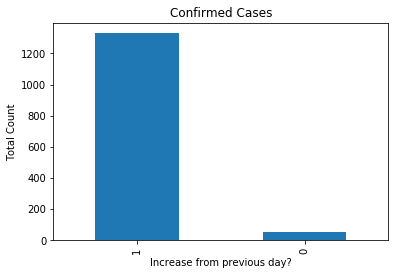

In [34]:
print('Confirmed')
print(Counter(df_confirmed['Confirmed'].values))
ax=df_confirmed['Confirmed'].value_counts().plot(kind="bar",title='Confirmed Cases')
ax.set_xlabel("Increase from previous day?")
ax.set_ylabel("Total Count")


Deaths
Counter({1: 1244, 0: 136})


Text(0, 0.5, 'Total Count')

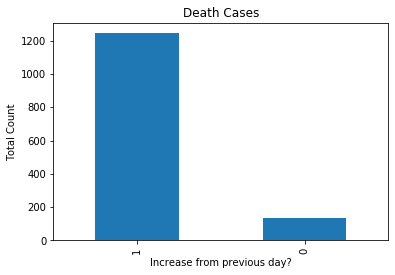

In [35]:
print('Deaths')
print(Counter(df_deaths['Deaths'].values))
ax=df_deaths['Deaths'].value_counts().plot(kind="bar",title='Death Cases')
ax.set_xlabel("Increase from previous day?")
ax.set_ylabel("Total Count")


Recovered
Counter({1: 864, 0: 516})


Text(0, 0.5, 'Total Count')

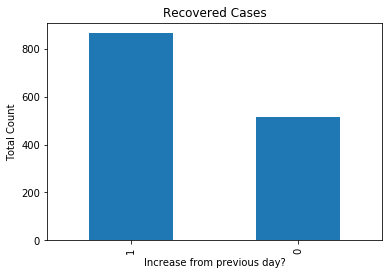

In [36]:
print('Recovered')
print(Counter(df_recovered['Recovered'].values))
ax=df_recovered['Recovered'].value_counts().plot(kind="bar",title='Recovered Cases')
ax.set_xlabel("Increase from previous day?")
ax.set_ylabel("Total Count")

<p>The 'Confirmed' label is <b>very</b> imabalanced with the dataset having 1329 'True' labels and 51 'False' Labels. The 'Deaths' Label is also imbalanced but however not as much as 'Confirmed', 'Deaths' have 1244 'True' Labels and 136 'False' Labels. Lastly the Recovered 'label' is the most balanced.<p>
    
<p>To cater to this imbalance problem in 'Confirmed' and 'Deaths', we will perform both Random Oversampling and Random Undersampling (performed below). <p>    

In [37]:
y_confirmed=df_confirmed['Confirmed'].values
y_deaths=df_deaths['Deaths'].values
y_recovered=df_recovered['Recovered'].values
x=df_onlyFeatures.values

ros = RandomOverSampler()
rus = RandomUnderSampler()

# over and under sampling
x_ros_confirmed, y_ros_confirmed = ros.fit_resample(x, y_confirmed)
print(Counter(y_ros_confirmed))
x_ros_rus_confirmed, y_ros_rus_confirmed=rus.fit_resample(x_ros_confirmed, y_ros_confirmed)
print('Confirmed')
print(Counter(y_ros_rus_confirmed))

# over and under sampling
x_ros_deaths, y_ros_deaths = ros.fit_resample(x, y_deaths)
x_ros_rus_deaths, y_ros_rus_deaths=rus.fit_resample(x_ros_deaths, y_ros_deaths)
print('Deaths')
print(Counter(y_ros_rus_deaths))

Counter({1: 1329, 0: 1329})
Confirmed
Counter({0: 1329, 1: 1329})
Deaths
Counter({0: 1244, 1: 1244})


Text(0, 0.5, 'Total Count')

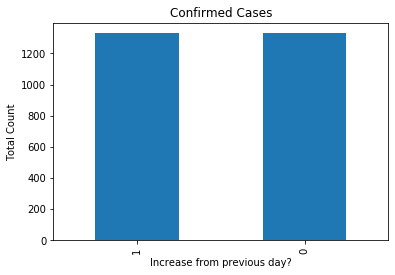

In [38]:
allFeatures = ['Day','Lat','Long_','Active','Incident_Rate','Total_Test_Results','Case_Fatality_Ratio','Testing_Rate','Resident Population 2020 Census','Population Density 2020 Census','Density Rank 2020 Census','SexRatio']
df_confirmed = pd.DataFrame(data = x_ros_rus_confirmed, columns = allFeatures )
df_confirmed['Confirmed'] = y_ros_rus_confirmed

ax=df_confirmed['Confirmed'].value_counts().plot(kind="bar",title='Confirmed Cases')
ax.set_xlabel("Increase from previous day?")
ax.set_ylabel("Total Count")

Text(0, 0.5, 'Total Count')

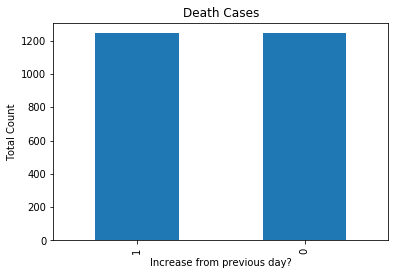

In [39]:
allFeatures = ['Day','Lat','Long_','Active','Incident_Rate','Total_Test_Results','Case_Fatality_Ratio','Testing_Rate','Resident Population 2020 Census','Population Density 2020 Census','Density Rank 2020 Census','SexRatio']
df_deaths = pd.DataFrame(data = x_ros_rus_deaths, columns = allFeatures )
df_deaths['Deaths'] = y_ros_rus_deaths

ax=df_deaths['Deaths'].value_counts().plot(kind="bar",title='Death Cases')
ax.set_xlabel("Increase from previous day?")
ax.set_ylabel("Total Count")

In [40]:
print('Confirmed')
print(Counter(df_confirmed['Confirmed'].values))
print('Deaths')
print(Counter(df_deaths['Deaths'].values))
print('Recovered')
print(Counter(df_recovered['Recovered'].values))

Confirmed
Counter({0: 1329, 1: 1329})
Deaths
Counter({0: 1244, 1: 1244})
Recovered
Counter({1: 864, 0: 516})


In [41]:
df_confirmed.isnull().sum()

Day                                0
Lat                                0
Long_                              0
Active                             0
Incident_Rate                      0
Total_Test_Results                 0
Case_Fatality_Ratio                0
Testing_Rate                       0
Resident Population 2020 Census    0
Population Density 2020 Census     0
Density Rank 2020 Census           0
SexRatio                           0
Confirmed                          0
dtype: int64

In [42]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

### Z-Score Normalization

<p>Since most of our models perform better on normalized data and also we can apply PCA on the normalized dataset only. Therefore we standardize using the z-score. The z-score standardization can be only applied on numeric data and not on categorical data hence we do not normalize days using it.</p>

In [43]:
columns_to_scale = ['Active','Lat','Long_','Incident_Rate','Total_Test_Results','Case_Fatality_Ratio','Testing_Rate','Resident Population 2020 Census','Population Density 2020 Census','Density Rank 2020 Census','SexRatio'] 
scaler = StandardScaler()
df_confirmed[columns_to_scale] = scaler.fit_transform(df_confirmed[columns_to_scale])

df_deaths[columns_to_scale] = scaler.fit_transform(df_deaths[columns_to_scale])

df_recovered[columns_to_scale] = scaler.fit_transform(df_recovered[columns_to_scale])
df_recovered.head()

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio,Recovered
0,2,-1.178670,0.304586,-0.200701,0.144028,-0.483568,-0.476902,-1.302217,-0.128626,-0.217091,0.118788,-1.168679,0
1,2,3.608919,-3.033032,-0.449116,-0.290315,-0.569578,-1.800519,2.071905,-0.754447,-0.276853,1.614954,3.492526,0
2,2,-0.946051,-0.945268,0.389194,0.088543,-0.007494,0.074416,-1.269412,0.181627,-0.239250,0.509092,0.385056,1
3,2,-0.741727,0.025825,-0.482520,0.202252,-0.456622,-0.031311,-0.559356,-0.422184,-0.242302,0.574143,-0.547185,1
4,2,-0.552794,-1.365662,4.276989,-0.502599,4.023547,-0.792949,-0.177608,4.905194,-0.122779,-0.922023,0.385056,0


<p> Performing z-score normalization on the dataset on numerical values. <p>

In [44]:
features = ['Day','Lat','Long_', 'Active', 'Incident_Rate', 'Total_Test_Results', 'Case_Fatality_Ratio', 'Testing_Rate', 'Resident Population 2020 Census', 'Population Density 2020 Census', 'Density Rank 2020 Census', 'SexRatio']

x_confirmed = df_confirmed.loc[:, features].values
y_confirmed = df_confirmed.loc[:,['Confirmed']].values

x_deaths = df_deaths.loc[:, features].values
y_deaths = df_deaths.loc[:,['Deaths']].values

x_recovered = df_recovered.loc[:, features].values
y_recovered = df_recovered.loc[:,['Recovered']].values

In [45]:
df_confirmed_targetOnly = df_confirmed['Confirmed']
df_confirmed_features = df_confirmed.drop(['Confirmed'], axis=1)
df_confirmed_features.head()

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio
0,2.0,-1.695742,-0.135602,-0.438205,-0.359499,-0.021340,0.882415,-0.201264,-0.019005,-0.266197,0.152337,-0.470931
1,2.0,0.373438,1.033073,-0.337065,0.358318,-0.435321,0.356119,1.581506,-0.676811,0.517210,-1.361468,-0.820773
2,3.0,0.357080,0.961676,-0.079697,-1.043848,0.009931,2.118679,0.400123,-0.213335,0.257033,-1.179812,-0.820773
3,3.0,-0.247489,-0.414549,0.054204,0.171092,-0.613135,-0.791966,-1.242170,-0.336765,-0.325265,1.060621,0.578595
4,3.0,0.697396,0.285324,-0.115555,-1.017519,0.701084,1.027294,-0.374792,0.982301,-0.208526,-0.332080,-0.121089


In [46]:
df_deaths_targetOnly = df_deaths['Deaths']
df_deaths_features = df_deaths.drop(['Deaths'], axis=1)
df_deaths_features.head()

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio
0,2.0,-1.042064,0.473109,-0.039894,0.146227,-0.339986,-0.355397,-1.295215,0.136111,-0.178821,-0.147659,-1.267839
1,2.0,-2.444138,-2.405894,-0.436592,-2.034949,-0.529378,-0.378725,-0.859371,-0.494916,-0.088150,-1.006732,0.472853
2,2.0,-1.185558,0.270609,-0.347790,-0.129028,0.071655,1.207111,-0.133476,0.071307,-0.172701,-0.209022,-0.770498
3,2.0,0.261812,-0.358839,-0.459575,0.207044,-0.586271,-0.852425,-0.221621,-0.650228,-0.245223,1.202312,1.218864
4,3.0,2.587135,-2.198158,-0.356521,-0.204682,-0.445900,-1.644717,1.789845,-0.622550,-0.248497,1.263675,2.462215


In [47]:
df_recovered_targetOnly = df_recovered['Recovered']
df_recovered_features = df_recovered.drop(['Recovered'], axis=1)
df_recovered_features.head()

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio
0,2,-1.178670,0.304586,-0.200701,0.144028,-0.483568,-0.476902,-1.302217,-0.128626,-0.217091,0.118788,-1.168679
1,2,3.608919,-3.033032,-0.449116,-0.290315,-0.569578,-1.800519,2.071905,-0.754447,-0.276853,1.614954,3.492526
2,2,-0.946051,-0.945268,0.389194,0.088543,-0.007494,0.074416,-1.269412,0.181627,-0.239250,0.509092,0.385056
3,2,-0.741727,0.025825,-0.482520,0.202252,-0.456622,-0.031311,-0.559356,-0.422184,-0.242302,0.574143,-0.547185
4,2,-0.552794,-1.365662,4.276989,-0.502599,4.023547,-0.792949,-0.177608,4.905194,-0.122779,-0.922023,0.385056


In [48]:
df_confirmed_prePCA=df_confirmed_features.copy()
df_deaths_prePCA=df_deaths_features.copy()
df_recovered_prePCA=df_recovered_features.copy()

In [49]:
df_confirmed_prePCA

,Day,Lat,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio
0,2.0,-1.695742,-0.135602,-0.438205,-0.359499,-0.021340,0.882415,-0.201264,-0.019005,-0.266197,0.152337,-0.470931
1,2.0,0.373438,1.033073,-0.337065,0.358318,-0.435321,0.356119,1.581506,-0.676811,0.517210,-1.361468,-0.820773
2,3.0,0.357080,0.961676,-0.079697,-1.043848,0.009931,2.118679,0.400123,-0.213335,0.257033,-1.179812,-0.820773
3,3.0,-0.247489,-0.414549,0.054204,0.171092,-0.613135,-0.791966,-1.242170,-0.336765,-0.325265,1.060621,0.578595
4,3.0,0.697396,0.285324,-0.115555,-1.017519,0.701084,1.027294,-0.374792,0.982301,-0.208526,-0.332080,-0.121089
...,...,...,...,...,...,...,...,...,...,...,...,...
2653,4.0,0.877298,-1.433741,-0.336418,0.224660,-0.698791,-1.131696,-1.317182,-0.539772,-0.336438,1.242277,1.278279
2654,21.0,-0.174497,0.716447,-0.533456,-1.246054,-0.609589,1.062273,0.832869,-0.752161,8.912062,-1.482573,-0.470931
2655,4.0,0.481569,1.032022,-0.233947,-0.872423,1.260022,2.147990,1.122164,0.419269,0.385602,-1.240364,-1.170615
2656,14.0,-1.469619,0.149476,-0.045385,0.430704,-0.430664,-0.514439,-1.129896,0.048713,-0.273262,0.212890,-1.170615


###  Onehot Encoding 

<p> Since 'day' is a categorical feature and for PCA we need normalized data therefore we one hot encode the day feature so that it can be normalized.</p>

In [50]:
add_columns_days_confirmed = pd.get_dummies(df_confirmed_prePCA['Day'])
add_columns_days_deaths = pd.get_dummies(df_deaths_prePCA['Day'])
add_columns_days_recovered = pd.get_dummies(df_recovered_prePCA['Day'])

In [51]:
df_confirmed_prePCA=pd.concat([add_columns_days_confirmed,df_confirmed_prePCA], axis=1)
df_confirmed_prePCA=df_confirmed_prePCA.drop(['Day'], axis=1)
df_confirmed_prePCA

,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,...,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio
0,1,0,0,0,0,0,0,0,0,0,...,-0.135602,-0.438205,-0.359499,-0.021340,0.882415,-0.201264,-0.019005,-0.266197,0.152337,-0.470931
1,1,0,0,0,0,0,0,0,0,0,...,1.033073,-0.337065,0.358318,-0.435321,0.356119,1.581506,-0.676811,0.517210,-1.361468,-0.820773
2,0,1,0,0,0,0,0,0,0,0,...,0.961676,-0.079697,-1.043848,0.009931,2.118679,0.400123,-0.213335,0.257033,-1.179812,-0.820773
3,0,1,0,0,0,0,0,0,0,0,...,-0.414549,0.054204,0.171092,-0.613135,-0.791966,-1.242170,-0.336765,-0.325265,1.060621,0.578595
4,0,1,0,0,0,0,0,0,0,0,...,0.285324,-0.115555,-1.017519,0.701084,1.027294,-0.374792,0.982301,-0.208526,-0.332080,-0.121089
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2653,0,0,1,0,0,0,0,0,0,0,...,-1.433741,-0.336418,0.224660,-0.698791,-1.131696,-1.317182,-0.539772,-0.336438,1.242277,1.278279
2654,0,0,0,0,0,0,0,0,0,0,...,0.716447,-0.533456,-1.246054,-0.609589,1.062273,0.832869,-0.752161,8.912062,-1.482573,-0.470931
2655,0,0,1,0,0,0,0,0,0,0,...,1.032022,-0.233947,-0.872423,1.260022,2.147990,1.122164,0.419269,0.385602,-1.240364,-1.170615
2656,0,0,0,0,0,0,0,0,0,0,...,0.149476,-0.045385,0.430704,-0.430664,-0.514439,-1.129896,0.048713,-0.273262,0.212890,-1.170615


In [52]:
df_deaths_prePCA=pd.concat([add_columns_days_deaths,df_deaths_prePCA], axis=1)
df_deaths_prePCA=df_deaths_prePCA.drop(['Day'], axis=1)
df_deaths_prePCA

,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,...,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio
0,1,0,0,0,0,0,0,0,0,0,...,0.473109,-0.039894,0.146227,-0.339986,-0.355397,-1.295215,0.136111,-0.178821,-0.147659,-1.267839
1,1,0,0,0,0,0,0,0,0,0,...,-2.405894,-0.436592,-2.034949,-0.529378,-0.378725,-0.859371,-0.494916,-0.088150,-1.006732,0.472853
2,1,0,0,0,0,0,0,0,0,0,...,0.270609,-0.347790,-0.129028,0.071655,1.207111,-0.133476,0.071307,-0.172701,-0.209022,-0.770498
3,1,0,0,0,0,0,0,0,0,0,...,-0.358839,-0.459575,0.207044,-0.586271,-0.852425,-0.221621,-0.650228,-0.245223,1.202312,1.218864
4,0,1,0,0,0,0,0,0,0,0,...,-2.198158,-0.356521,-0.204682,-0.445900,-1.644717,1.789845,-0.622550,-0.248497,1.263675,2.462215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2483,0,0,0,0,0,0,0,0,0,0,...,0.762490,-0.194162,-0.200026,0.785075,-0.550420,-0.403158,1.093544,-0.096620,-0.884007,-1.019168
2484,0,0,0,0,0,0,0,0,0,0,...,-0.052224,-0.459765,2.058793,-0.438202,-0.113909,1.759003,-0.614470,-0.241380,1.079588,1.467534
2485,0,1,0,0,0,0,0,0,0,0,...,0.270609,-0.332875,-0.083567,0.079149,1.166408,-0.113184,0.071307,-0.172701,-0.209022,-0.770498
2486,1,0,0,0,0,0,0,0,0,0,...,0.978036,0.610786,-0.598097,0.706833,3.505206,-0.197166,0.890145,0.649458,-1.804443,-1.019168


In [53]:
df_recovered_prePCA=pd.concat([add_columns_days_recovered,df_recovered_prePCA], axis=1)
df_recovered_prePCA=df_recovered_prePCA.drop(['Day'], axis=1)
df_recovered_prePCA

,2,3,4,5,6,7,8,9,10,11,...,Long_,Active,Incident_Rate,Total_Test_Results,Case_Fatality_Ratio,Testing_Rate,Resident Population 2020 Census,Population Density 2020 Census,Density Rank 2020 Census,SexRatio
0,1,0,0,0,0,0,0,0,0,0,...,0.304586,-0.200701,0.144028,-0.483568,-0.476902,-1.302217,-0.128626,-0.217091,0.118788,-1.168679
1,1,0,0,0,0,0,0,0,0,0,...,-3.033032,-0.449116,-0.290315,-0.569578,-1.800519,2.071905,-0.754447,-0.276853,1.614954,3.492526
2,1,0,0,0,0,0,0,0,0,0,...,-0.945268,0.389194,0.088543,-0.007494,0.074416,-1.269412,0.181627,-0.239250,0.509092,0.385056
3,1,0,0,0,0,0,0,0,0,0,...,0.025825,-0.482520,0.202252,-0.456622,-0.031311,-0.559356,-0.422184,-0.242302,0.574143,-0.547185
4,1,0,0,0,0,0,0,0,0,0,...,-1.365662,4.276989,-0.502599,4.023547,-0.792949,-0.177608,4.905194,-0.122779,-0.922023,0.385056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,0,0,0,0,0,0,0,0,0,0,...,1.027710,-0.524201,-2.293948,-0.625809,-0.270412,1.274271,-0.767619,-0.235038,0.378991,-0.236438
1376,0,0,0,0,0,0,0,0,0,0,...,0.749535,0.400942,-0.559558,-0.005286,-0.534982,-0.745315,0.397468,-0.144206,-0.726871,-0.236438
1377,0,0,0,0,0,0,0,0,0,0,...,0.607653,-0.488254,-0.195930,-0.475825,0.062389,0.411281,-0.599800,-0.232108,0.248890,0.074309
1378,0,0,0,0,0,0,0,0,0,0,...,0.166286,-0.391879,1.287559,0.129702,-0.830494,0.351006,-0.001819,-0.211231,-0.011313,0.385056


<p>The preprocessing steps that we have used are :-</p>
    <ol>
    <li>Checking & Removing for NA values
    <li>Checking & Removing for Duplicate rows
    <li>Checking dtypes of dataframe & coverting them to appropriate types
    <li> Outlier Detection
    <li> Dropping columns
    <li> Dealing with imbalanced Dataset
    <li> Normalization using z-score(standardization)
    <li> One hot encoding
    </ol>
<p> A summary to all these steps is provided above in the code where they are implemented</p>    

'Day' column is in our case needs to be onehot encoded before we feed it to the PCA for dimensionality reduction. Since the day here can be considered as of categorical type and hence it is necessary to onehot encode it. If we dont do it is treated as a continuos numeric value. </p> 

<p>The 'State' and 'State_ID' columns have been dropped since they are not relevant to the target in this case. The State name does not have any impact on the three targets and the State_ID is just numeric categorical conversion of 'State'. Since our target in this is how a state is being effected by COVID-19 the 'State' and 'State_ID' do not provide any information regarding targets. Instead we have kept the 'Lat' and 'Long_' columns since they also help to distinguish between States and are also useful since can provide information that if the targets depends on the geographical location. </p> 

---

In [54]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# CM2

# PCA
## Confirmed

total variance 1.0


Text(0, 0.5, 'explained_variance_ratio')

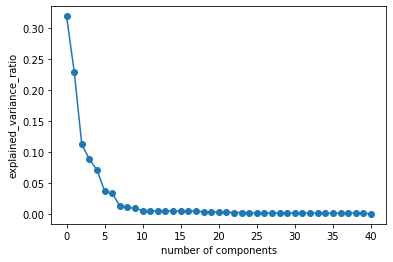

In [55]:
pca = PCA(n_components=41).fit(df_confirmed_prePCA)
plt.plot(pca.explained_variance_ratio_, marker = 'o')
scores=pca.explained_variance_ratio_
s=scores.sum()
print('total variance',s)
plt.xlabel('number of components')
plt.ylabel('explained_variance_ratio')

In [56]:
arr=[]
for x in range(1,42):
    x="%s" %x
    a = 'PC' + x
    arr.append(a)

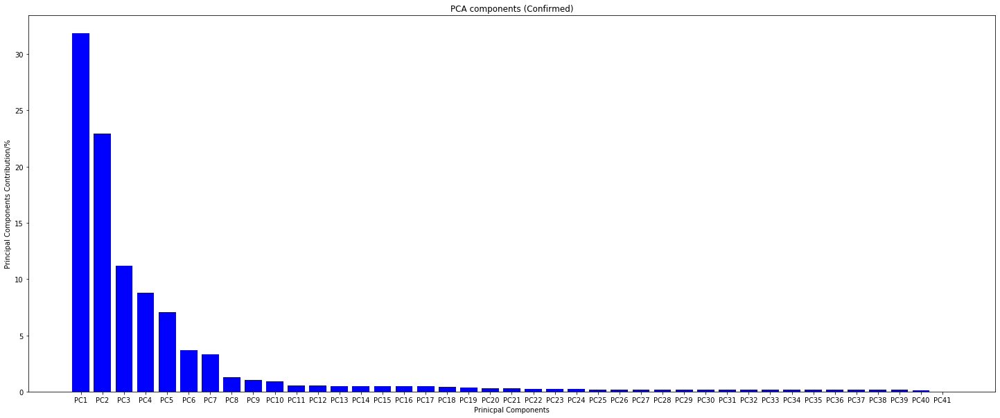

In [57]:
plt.figure(figsize=(25,10)) 
plt.bar(arr, pca.explained_variance_ratio_*100 , color ='blue')
 
plt.xlabel("Prinicpal Components")
plt.ylabel("Principal Components Contribution/%")
plt.title("PCA components (Confirmed)")
plt.show()


<p> Based on the above graph we can see see first 8 principal components hold the most information. After PC8 all the remaining principal components hold very insignificant information. Also the cumulative variance of the first 8 principal components is 90%. </p>

In [58]:
pca = PCA(n_components=8)
principalComponents = pca.fit_transform(df_confirmed_prePCA)
principalDf_confirmed = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2','PC3','PC4','PC5','PC6','PC7','PC8'])
principalDf_confirmed.shape

(2658, 8)

In [59]:
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.cumsum())

[3.8087852  2.74317385 1.33881922 1.05322458 0.84614434 0.43878039
 0.39877639 0.15326474]
[0.31846194 0.22936354 0.11194198 0.08806271 0.07074822 0.03668751
 0.03334268 0.01281484]
[0.31846194 0.54782548 0.65976746 0.74783017 0.81857838 0.8552659
 0.88860857 0.90142342]


In [60]:
principalDf_confirmed['Confirmed']=df_confirmed_targetOnly
principalDf_confirmed.shape

(2658, 9)

In [61]:
principalDf_confirmed.isnull().sum()

PC1          0
PC2          0
PC3          0
PC4          0
PC5          0
PC6          0
PC7          0
PC8          0
Confirmed    0
dtype: int64

In [62]:
principalDf_confirmed

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Confirmed
0,-0.431465,0.082818,-1.661292,-0.201435,-0.013455,0.737704,0.768388,-0.132842,0
1,-1.550358,-1.979677,0.649273,-0.574587,0.020091,0.415600,-0.486661,0.017412,0
2,-2.301140,-1.121563,-0.304790,1.057181,-0.610970,0.032155,0.770779,-0.274926,0
3,1.815730,0.482667,-0.716085,-0.070677,0.072204,-0.546974,-0.086859,-0.230141,0
4,-1.101464,0.570996,0.084535,1.325279,-0.788552,-0.392544,0.469734,0.422414,0
...,...,...,...,...,...,...,...,...,...
2653,2.997519,0.390033,0.199291,0.565574,0.126321,-0.442187,0.080831,0.284324,1
2654,-3.244259,-3.490947,0.144486,2.419162,7.419693,-1.770442,0.119618,0.045246,1
2655,-3.163800,-0.662700,0.406605,0.895961,-0.664225,0.193336,0.762179,0.161723,1
2656,0.138422,0.375773,-1.919768,-1.127991,0.080792,-0.346849,-0.370958,0.222745,1


---

In [63]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# PCA 
## Deaths

Text(0, 0.5, 'explained_variance_ratio')

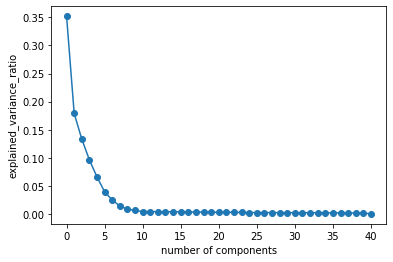

In [64]:
pca = PCA(n_components=41).fit(df_deaths_prePCA)
plt.plot(pca.explained_variance_ratio_, marker = 'o')
plt.xlabel('number of components')
plt.ylabel('explained_variance_ratio')

In [65]:
arr=[]
for x in range(1,42):
    x="%s" %x
    a = 'PC' + x
    arr.append(a)

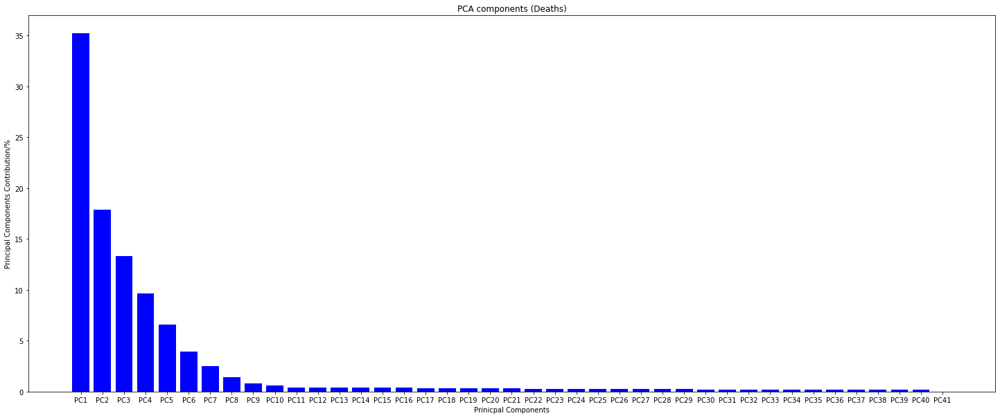

In [66]:

plt.figure(figsize=(25,10)) 
plt.bar(arr, pca.explained_variance_ratio_*100 , color ='blue')
 
plt.xlabel("Prinicpal Components")
plt.ylabel("Principal Components Contribution/%")
plt.title("PCA components (Deaths)")
plt.show()


<p> Based on the above graph we can see see first 8 principal components hold the most information. After PC8 all the remaining principal components hold very insignificant information. Also the cumulative variance of the first 8 principal components is 90%. </p>

In [67]:
from sklearn.decomposition import PCA
pca = PCA(n_components=8)
principalComponents = pca.fit_transform(df_deaths_prePCA)
principalDf_deaths = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2','PC3','PC4','PC5','PC6','PC7','PC8'])
principalDf_deaths.shape

(2488, 8)

In [68]:
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.cumsum())

[4.21358986 2.14092915 1.59406325 1.15185645 0.78604185 0.47293346
 0.29600705 0.1700485 ]
[0.35205326 0.17887861 0.13318694 0.09623974 0.06567526 0.03951447
 0.02473194 0.01420787]
[0.35205326 0.53093186 0.66411881 0.76035855 0.82603381 0.86554828
 0.89028021 0.90448808]


In [69]:
principalDf_deaths['Deaths']=df_deaths_targetOnly

In [70]:
principalDf_deaths.shape

(2488, 9)

---

In [71]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# PCA 
## Recovered

[0.32076384 0.52250549 0.65610871 0.73980573 0.8068355  0.84807876
 0.88507197 0.90186816 0.91113373 0.91785435 0.92063994 0.92342546
 0.92621097 0.92899649 0.931782   0.93456752 0.93735303 0.94013855
 0.94292406 0.94570958 0.94849509 0.95128061 0.95406612 0.95685164
 0.95963715 0.96242267 0.96520818 0.9679937  0.97077922 0.97356473
 0.97635025 0.97913576 0.98192128 0.98470679 0.98749231 0.99027781
 0.99306318 0.99584689 0.99845475 1.         1.        ]


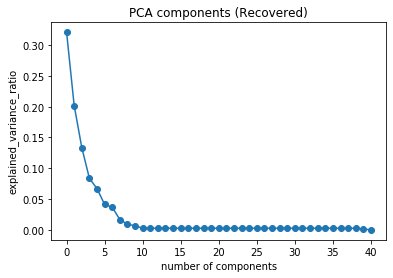

In [72]:
pca = PCA(n_components=41).fit(df_recovered_prePCA)
plt.plot(pca.explained_variance_ratio_, marker = 'o')
plt.xlabel('number of components')
plt.ylabel('explained_variance_ratio')
plt.title("PCA components (Recovered)")

print(pca.explained_variance_ratio_.cumsum())

In [73]:
arr=[]
for x in range(1,42):
    x="%s" %x
    a = 'CM' + x
    arr.append(a)

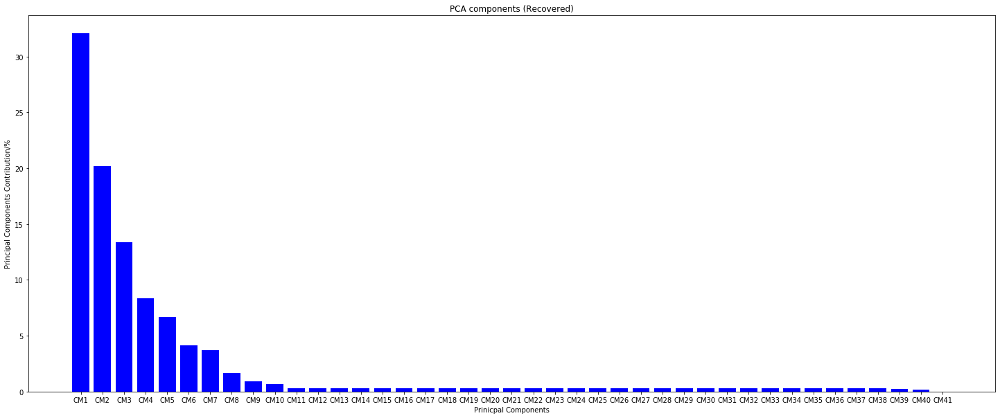

In [74]:
plt.figure(figsize=(25,10)) 
plt.bar(arr, pca.explained_variance_ratio_*100 , color ='blue')
 
plt.xlabel("Prinicpal Components")
plt.ylabel("Principal Components Contribution/%")
plt.title("PCA components (Recovered)")
plt.show()


<p> Based on the above graph we can see see first 8 principal components hold the most information. After PC8 all the remaining principal components hold very insignificant information. Also the cumulative variance of the first 8 principal components is 90%. </p>

In [75]:
pca = PCA(n_components=8)
principalComponents = pca.fit_transform(df_recovered_prePCA)
principalDf_recovered = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2','PC3','PC4','PC5','PC6','PC7','PC8'])
principalDf_recovered.shape

(1380, 8)

In [76]:
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.cumsum())


[3.84125748 2.41592569 1.59994465 1.00230061 0.80270458 0.49390229
 0.44300643 0.20114007]
[0.32076384 0.20174165 0.13360323 0.08369702 0.06702977 0.04124326
 0.03699321 0.01679618]
[0.32076384 0.52250549 0.65610871 0.73980573 0.8068355  0.84807876
 0.88507197 0.90186816]


In [77]:
principalDf_recovered['Recovered']=df_recovered_targetOnly

In [78]:
principalDf_recovered.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Recovered
0,0.167289,-0.202046,-2.123755,-0.389615,0.279090,-0.300402,0.255593,0.134441,0
1,-4.792232,1.593028,3.945457,1.752560,-1.045291,0.054170,0.162663,-0.637015,0
2,-0.328110,1.133464,-1.277333,0.449386,0.396552,0.371481,-0.731861,0.020160,1
3,-0.463401,-0.359201,-1.191848,-0.345832,0.172995,0.222039,-0.084106,0.369486,1
4,4.516027,6.171078,1.154601,1.408415,-0.075265,-0.668954,0.226275,-0.052008,0


---
---

In [79]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# LDA 
## Confirm

In [80]:
y_confirmed.shape
arr = np.array(y_confirmed)
y_confirmed_newarr = arr.reshape(y_confirmed.shape[0],)
y_confirmed_newarr.shape

(2658,)

In [81]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

LDA_transform = LinearDiscriminantAnalysis()
LDA_transform.fit(x_confirmed, y_confirmed_newarr)
features_new_confirmed = LDA_transform.transform(x_confirmed)

# Print the number of features
print('Original feature #:', x_confirmed.shape[1])
print('Reduced feature #:', features_new_confirmed.shape[1])

# Print the ratio of explained variance
print(LDA_transform.explained_variance_ratio_)

Original feature #: 12
Reduced feature #: 1
[1.]


In [82]:
features_new_confirmed.shape

(2658, 1)

In [83]:
features_new_confirmed

array([[-0.21620619],
       [-0.72196984],
       [-1.41429814],
       ...,
       [-0.05542792],
       [-0.12948995],
       [-0.39799203]])

In [84]:
LDA_Df_confirmed = pd.DataFrame(data = features_new_confirmed, columns = ['LDA1'])
LDA_Df_confirmed['Confirmed'] = y_confirmed_newarr
LDA_Df_confirmed.head()

,LDA1,Confirmed
0,-0.216206,0
1,-0.721970,0
2,-1.414298,0
3,0.530155,0
4,0.190669,0


***

In [85]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# LDA 
## Deaths

In [86]:
y_deaths.shape
arr = np.array(y_deaths)
y_deaths_newarr = arr.reshape(y_deaths.shape[0],)
y_deaths_newarr.shape

(2488,)

In [87]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

LDA_transform = LinearDiscriminantAnalysis()
LDA_transform.fit(x_deaths, y_deaths_newarr)
features_new_deaths = LDA_transform.transform(x_deaths)

# Print the number of features
print('Original feature #:', x_deaths.shape[1])
print('Reduced feature #:', features_new_deaths.shape[1])

# Print the ratio of explained variance
print(LDA_transform.explained_variance_ratio_)

Original feature #: 12
Reduced feature #: 1
[1.]


In [88]:
features_new_deaths.shape

(2488, 1)

In [89]:
features_new_deaths

array([[ 2.31848888],
       [-1.02131478],
       [ 0.32023248],
       ...,
       [ 0.34954264],
       [-0.65090393],
       [ 0.11530644]])

In [90]:
LDA_Df_deaths = pd.DataFrame(data = features_new_deaths, columns = ['LDA1'])
LDA_Df_deaths['Deaths'] = y_deaths_newarr
LDA_Df_deaths.head()

,LDA1,Deaths
0,2.318489,0
1,-1.021315,0
2,0.320232,0
3,-1.272279,0
4,-1.276164,0


---

In [91]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# LDA 
## Recovered

In [92]:
y_recovered.shape
arr = np.array(y_recovered)
y_recovered_newarr = arr.reshape(y_recovered.shape[0],)
y_recovered_newarr.shape

(1380,)

In [93]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

LDA_transform = LinearDiscriminantAnalysis()
LDA_transform.fit(x_recovered, y_recovered_newarr)
features_new_recovered = LDA_transform.transform(x_recovered)

# Print the number of features
print('Original feature #:', x_recovered.shape[1])
print('Reduced feature #:', features_new_recovered.shape[1])

# Print the ratio of explained variance
print(LDA_transform.explained_variance_ratio_)

Original feature #: 12
Reduced feature #: 1
[1.]


In [94]:
LDA_Df_recovered = pd.DataFrame(data = features_new_recovered, columns = ['LDA1'])
LDA_Df_recovered['Recovered'] = y_recovered_newarr
LDA_Df_recovered.head()

,LDA1,Recovered
0,-0.699579,0
1,-1.373272,0
2,-0.592854,1
3,-0.216869,1
4,-3.844399,0


In [95]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Data point plot on PC1 and PC2
#### we Plot this data for a single day i.e 5th,jan,2021 for all the states.

### Confirmed

In [96]:
df_confirmed_PCAPlot=df_confirmed.loc[df_confirmed["Day"] == 5]
df_confirmed_PCAPlot
df_confirmed_PCAPlot_targetOnly = df_confirmed_PCAPlot['Confirmed']
df_confirmed_PCAPlot_features = df_confirmed_PCAPlot.drop(['Day','Confirmed'], axis=1)

Text(0.5, 1.0, 'PCA of Confirmed Cases')

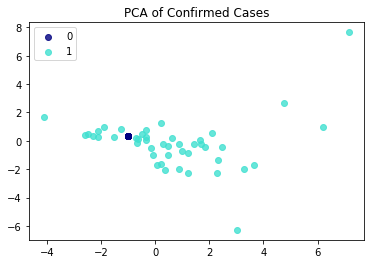

In [97]:

pca = PCA(n_components=2).fit(df_confirmed_PCAPlot_features).transform(df_confirmed_PCAPlot_features)
plt.figure()
colors = ['navy', 'turquoise']
lw = 1
y = df_confirmed_PCAPlot_targetOnly
target_names = df_confirmed_PCAPlot_targetOnly.unique()
for color, i, target_name in zip(colors, [0, 1], target_names):
    plt.scatter(pca[y == i, 0], pca[y == i, 1], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA of Confirmed Cases')

<p>Since our dataset is imbalanced for 'Confirmed' and we have used over and undersampling for it. Hence the false cases i.e 0 are overlapping(as oversampling duplicates the same data points) and can be seen as one where True cases i.e 1 are more spread. Since the variance of first two eigen vectors is less therefore the dont seem seprable </p>

In [98]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

### Deaths

In [99]:
df_deaths_PCAPlot=df_deaths.loc[df_deaths["Day"] == 5]
df_deaths_PCAPlot
df_deaths_PCAPlot_targetOnly = df_deaths_PCAPlot['Deaths']
df_deaths_PCAPlot_features = df_deaths_PCAPlot.drop(['Day','Deaths'], axis=1)

Text(0.5, 1.0, 'PCA of Death Cases')

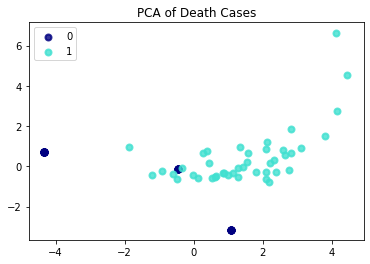

In [100]:

pca = PCA(n_components=2).fit(df_deaths_PCAPlot_features).transform(df_deaths_PCAPlot_features)
plt.figure()
colors = ['navy', 'turquoise']
lw = 2
y = df_deaths_PCAPlot_targetOnly
target_names = df_deaths_PCAPlot_targetOnly.unique()
for color, i, target_name in zip(colors, [0, 1, 2], target_names):
    plt.scatter(pca[y == i, 0], pca[y == i, 1], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA of Death Cases')

<p>Since our dataset is imbalanced for 'Deaths' and we have used over and undersampling for it. Hence the false cases i.e 0 are overlapping(as oversampling duplicates the same data points) and can be seen as only few where True cases i.e 1 are more spread. Since the variance of first two eigen vectors is less therefore the dont seem seprable. </p>

In [101]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

### Recovered

In [102]:
df_recovered_PCAPlot=df_recovered.loc[df_recovered["Day"] == 5]
df_recovered_PCAPlot
df_recovered_PCAPlot_targetOnly = df_recovered_PCAPlot['Recovered']
df_recovered_PCAPlot_features = df_recovered_PCAPlot.drop(['Day','Recovered'], axis=1)

Text(0.5, 1.0, 'PCA of Recovered Cases')

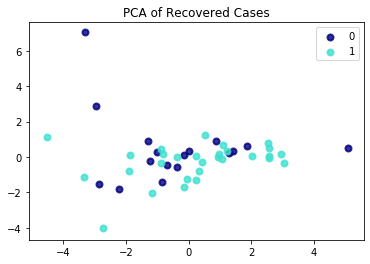

In [103]:
pca = PCA(n_components=2).fit(df_recovered_PCAPlot_features).transform(df_recovered_PCAPlot_features)
plt.figure()
colors = ['navy', 'turquoise']
lw = 2
y = df_recovered_PCAPlot_targetOnly
target_names = df_recovered_PCAPlot_targetOnly.unique()
for color, i, target_name in zip(colors, [0, 1, 2], target_names):
    plt.scatter(pca[y == i, 0], pca[y == i, 1], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA of Recovered Cases')


<p>Since our dataset is most balanced for 'Recovered' and we have used over and undersampling for it. Hence the false cases i.e 0 and True cases i.e 1 are equally spread . Since the variance of first two eigen vectors is less therefore the dont seem seprable.</p>

In [104]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

### is LDA better for one label compared to the others.

### Confirmed

In [105]:
x_confirmed_lda = LDA_Df_confirmed.loc[:, 'LDA1'].values
y_confirmed_lda = LDA_Df_confirmed.loc[:,['Confirmed']].values
x_confirmed_lda = x_confirmed_lda.reshape(-1, 1)

arr = np.array(y_confirmed_lda)
y_confirmed_newarr_lda = arr.reshape(y_confirmed_lda.shape[0],)

x_train,x_test,y_train,y_test=train_test_split(x_confirmed_lda, y_confirmed_newarr_lda, test_size=0.2)

In [106]:
clf = RandomForestClassifier()
accuracy = cross_val_score(clf, x_train, y_train , cv=10, scoring='accuracy')
accuracy.mean()

0.975531490831783

### Deaths

In [107]:
x_deaths_lda = LDA_Df_deaths.loc[:, 'LDA1'].values
y_deaths_lda = LDA_Df_deaths.loc[:,['Deaths']].values
x_deaths_lda = x_deaths_lda.reshape(-1, 1)

arr = np.array(y_deaths_lda)
y_deaths_newarr_lda = arr.reshape(y_deaths_lda.shape[0],)
y_deaths_newarr.shape

x_train,x_test,y_train,y_test=train_test_split(x_deaths_lda, y_deaths_newarr_lda, test_size=0.2)

In [108]:
clf = RandomForestClassifier()
accuracy = cross_val_score(clf, x_train, y_train , cv=10, scoring='accuracy')
accuracy.mean()

0.9472361809045227

### Recovered

In [109]:
x_recovered_lda = LDA_Df_recovered.loc[:, 'LDA1'].values
y_recovered_lda = LDA_Df_recovered.loc[:,['Recovered']].values
x_recovered_lda = x_recovered_lda.reshape(-1, 1)

arr = np.array(y_recovered_lda)
y_recovered_newarr_lda = arr.reshape(y_recovered_lda.shape[0],)
y_recovered_newarr.shape

x_train,x_test,y_train,y_test=train_test_split(x_recovered_lda, y_recovered_newarr_lda, test_size=0.2)

In [110]:
clf = RandomForestClassifier()
accuracy = cross_val_score(clf, x_train, y_train , cv=10, scoring='accuracy')
accuracy.mean()

0.7436691236691237

<p>When LDA feature is applied on Random Forest Classifier using the default parameters using 20% test data the Confirmed label gives the highest accuracy followed by Deaths. The Recovered labels gives the least accuracy. </p>

---
---

In [111]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# CM3 Decision Trees Classifier
## Confirmed

<p> For this part we have used the value of K as 10 for Kfold Cross Validation </p>

In [112]:
x_train,x_test,y_train,y_test=train_test_split(x_confirmed, y_confirmed_newarr, test_size=0.2, random_state=98)

[0.8367902382850563, 0.9073589334750641, 0.9670741429710337, 0.9840087695987243]


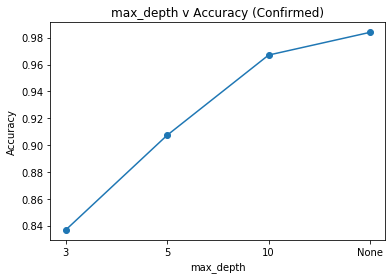

[0.8367902382850563, 0.9073589334750641, 0.9670741429710337, 0.9840087695987243]


In [113]:
max_depth = [3, 5, 10, None]
max_depth_string = ['3', '5', '10', 'None']
accuracy_arr=[]
for d in max_depth:
    clf = DecisionTreeClassifier(max_depth=d)
    accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')
    accuracy_arr.append(accuracy.mean())
print(accuracy_arr)
    
plt.plot( max_depth_string, accuracy_arr, marker = 'o')
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.title("max_depth v Accuracy (Confirmed)")
plt.show()

print(accuracy_arr)

#### plotting tree plot for 10 depth tree for examining the splitting rules

In [114]:
clf = DecisionTreeClassifier(max_depth=10)
accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')


Text(0.5, 1.0, 'Decision tree for Target-Confirmed')

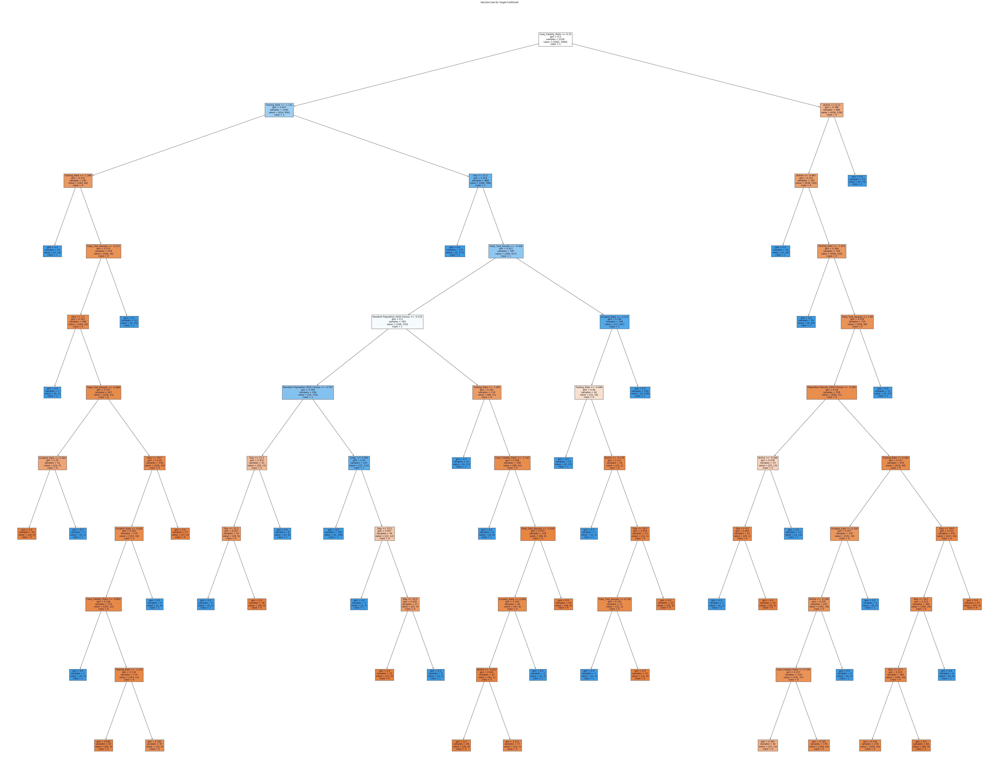

In [115]:

clf.fit(x_train,y_train)

fig = plt.figure(figsize=(100,80))
_ = tree.plot_tree(clf, 
                   feature_names=allFeatures,  
                   class_names=["0","1"],
                   filled=True)
plt.title('Decision tree for Target-Confirmed')

<p> From the above tree we can see an interesting observation that the first splitting condition is "case_fatality_ratio" <=0.141, its gini =0.5 and has 2126 samples which are split in values[1062,1064] and class=1. The furthe splits are on 'Testing_rate' and  'SexRaio'. (The in the report may appear unclear but the conditions are visible on zooming in, in the notebook) </p>

### Of all the parameter d for maxdepth=[3, 5, 10, None], the best accuracy 0.98 is given by max_depth = None

### Testing accuracy on test data for best accuracy using max_depth = none

In [116]:
clf = DecisionTreeClassifier(max_depth=None)
clf.fit(x_train,y_train)

y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9849624060150376
AUC 0.9849056603773585
f1score 0.9846743295019157


### Exporting model to .joblib (for testing for CM8)

In [117]:
from joblib import dump, load
dump(clf, 'clf_DT_Confirmed.joblib') 

['clf_DT_Confirmed.joblib']

### Storing metrics in dataframe for model comparison later in CM7

In [118]:
df_interpretability_confirmed.loc['Decision Trees Classifier', 'Accuracy'] = accuracy
df_interpretability_confirmed.loc['Decision Trees Classifier', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_confirmed.loc['Decision Trees Classifier', 'F1-Score'] = f_score
df_interpretability_confirmed;

---

### grow until leaf contains 2 datapoints

In [119]:
clf = DecisionTreeClassifier(max_depth=None,min_samples_split=3)
accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')


Text(0.5, 1.0, 'Decision tree with leaf contain 2 data points for Target-Confirmed')

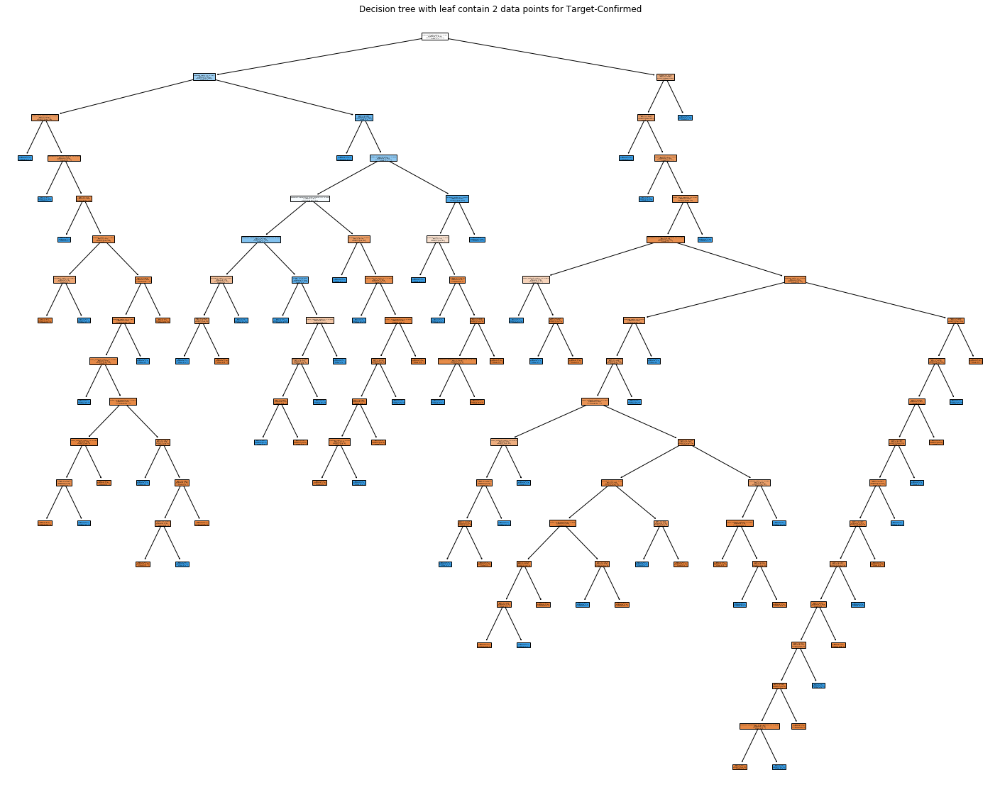

In [120]:

clf.fit(x_train,y_train)

fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(clf, 
                   feature_names=allFeatures,  
                   class_names=["0","1"],
                   filled=True)
plt.title('Decision tree with leaf contain 2 data points for Target-Confirmed')

<p> The visualization above although doesnt allow us to see the split features and values due to the size constraints in this report but they do show us that how the tree is divided and the number of nodes in each leaf.</p>

In [121]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Deaths

In [122]:
x_train,x_test,y_train,y_test=train_test_split(x_deaths, y_deaths_newarr, test_size=0.2, random_state=98)

[0.7994974874371858, 0.8597989949748743, 0.9321608040201005, 0.9572864321608041]


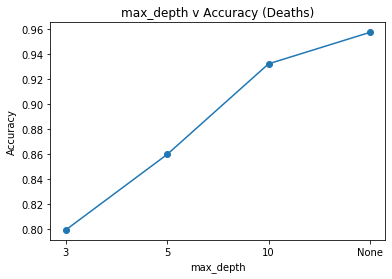

[0.7994974874371858, 0.8597989949748743, 0.9321608040201005, 0.9572864321608041]


In [123]:
max_depth = [3, 5, 10, None]
max_depth_string = ['3', '5', '10', 'None']
accuracy_arr=[]
for d in max_depth:
    clf = DecisionTreeClassifier(max_depth=d)
    accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')
    accuracy_arr.append(accuracy.mean())
print(accuracy_arr)
    
plt.plot(max_depth_string,accuracy_arr, marker = 'o')
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.title("max_depth v Accuracy (Deaths)")
plt.show()

print(accuracy_arr)

#### plotting tree plot for 10 depth tree for examining the splitting rules

In [124]:
clf = DecisionTreeClassifier(max_depth=10)
accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')

Text(0.5, 1.0, 'Decision tree for Target-Death')

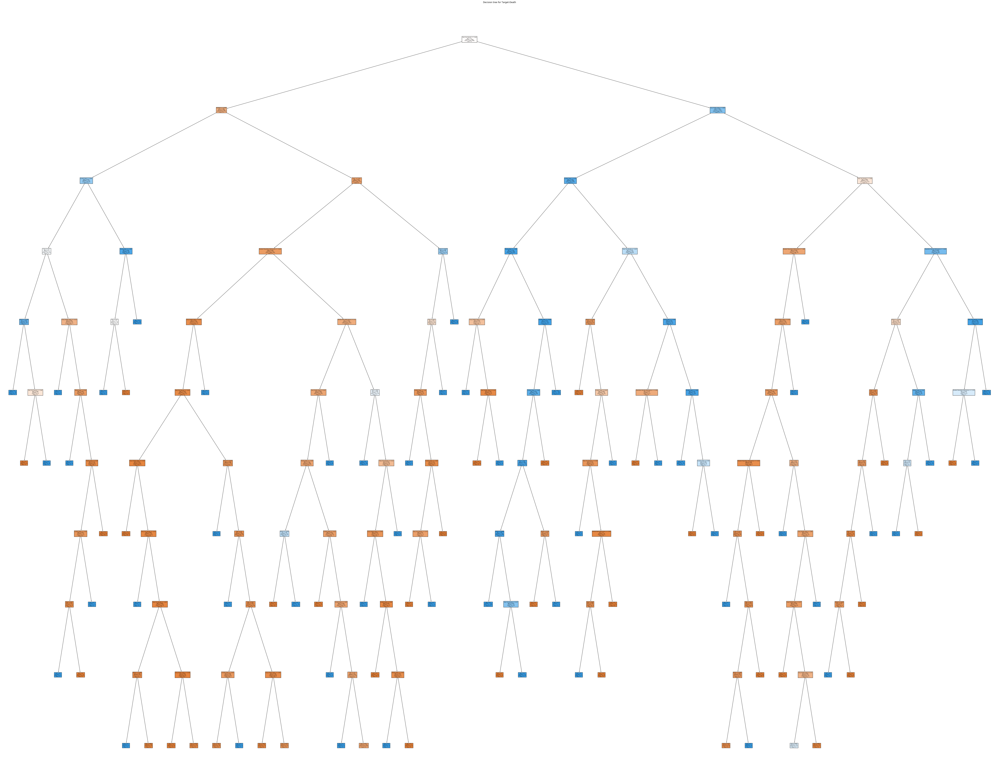

In [125]:
from sklearn import tree
clf.fit(x_train,y_train)

fig = plt.figure(figsize=(100,80))
_ = tree.plot_tree(clf, 
                   feature_names=allFeatures,  
                   class_names=["0","1"],
                   filled=True)
plt.title('Decision tree for Target-Death')

<p> From the above tree we can see an intersting observation that the splitting condition "Total_Test_Results" <=-0.419, its gini =0.5 and has 1990 samples which are split in values[1002,988] and class=0. The furthe splits which further divide the date are on the features 'Case_fatality_ratio' and  'SexRaio'. (The in the report may appear unclear but the conditions are visible on zooming in, in the notebook) </p>

### the best accuracy is given by max_depth = None (shown above in graph)

In [126]:
clf = DecisionTreeClassifier(max_depth=None)
clf.fit(x_train,y_train)

y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9598393574297188
AUC 0.9609375
f1score 0.959349593495935


### Exporting model to .joblib

In [127]:
from joblib import dump, load
dump(clf, 'clf_DT_Deaths.joblib') 

['clf_DT_Deaths.joblib']

### Storing metrics in dataframe for model comparison later in CM7

In [128]:
df_interpretability_deaths.loc['Decision Trees Classifier', 'Accuracy'] = accuracy
df_interpretability_deaths.loc['Decision Trees Classifier', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_deaths.loc['Decision Trees Classifier', 'F1-Score'] = f_score
df_interpretability_deaths

,Accuracy,AUC,F1-Score
Decision Trees Classifier,0.959839,0.960938,0.95935
Random Forest Classifier,NaN,NaN,NaN
Gradient Tree Boosting,NaN,NaN,NaN
Naive Bayes,NaN,NaN,NaN


### grow until leaf contains 2 datapoints

Text(0.5, 1.0, 'Decision tree with leaf containing 2 datapoints for Target-Death')

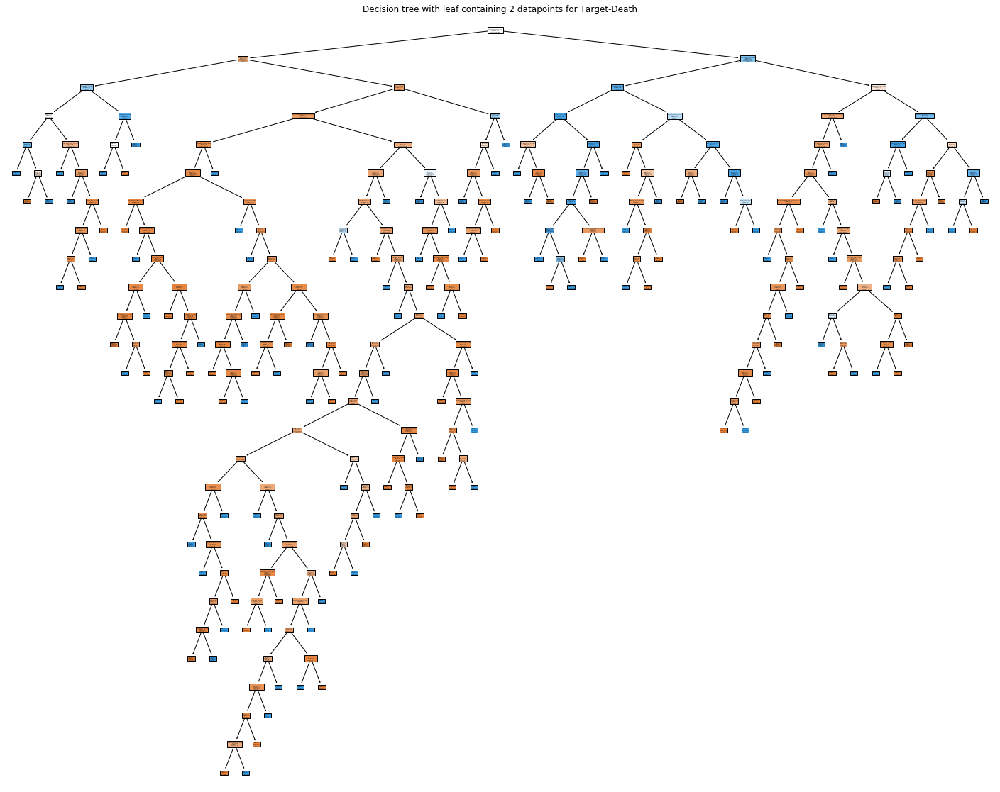

In [129]:
clf = DecisionTreeClassifier(max_depth=None,min_samples_split=3)
accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')

clf.fit(x_train,y_train)

fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(clf, 
                   feature_names=allFeatures,  
                   class_names=["0","1"],
                   filled=True)
plt.title('Decision tree with leaf containing 2 datapoints for Target-Death')

<p> The visualization above although doesnt allow us to see the split features and values due to the size constraints in this report but they do show us that how the tree is divided and the number of nodes in each leaf.</p>

---

In [130]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Recovered

In [131]:
x_train,x_test,y_train,y_test=train_test_split(x_recovered, y_recovered_newarr, test_size=0.2, random_state=98)

[0.836076986076986, 0.8858476658476657, 0.9175429975429974, 0.9094266994266995]


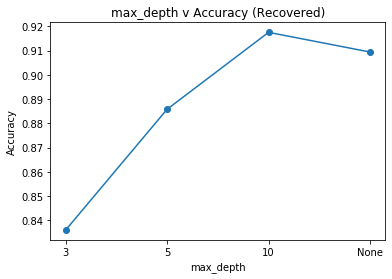

[0.836076986076986, 0.8858476658476657, 0.9175429975429974, 0.9094266994266995]


In [132]:
max_depth = [3, 5, 10, None]
max_depth_string = ['3', '5', '10', 'None']
accuracy_arr=[]
for d in max_depth:
    clf = DecisionTreeClassifier(max_depth=d)
    accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')
    accuracy_arr.append(accuracy.mean())
print(accuracy_arr)
    
plt.plot(max_depth_string, accuracy_arr, marker = 'o')
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.title("max_depth v Accuracy (Recovered)")
plt.show()

print(accuracy_arr)

#### plotting tree plot for 10 depth tree for examining the splitting rules

Text(0.5, 1.0, 'Decision tree for Target-Recovered')

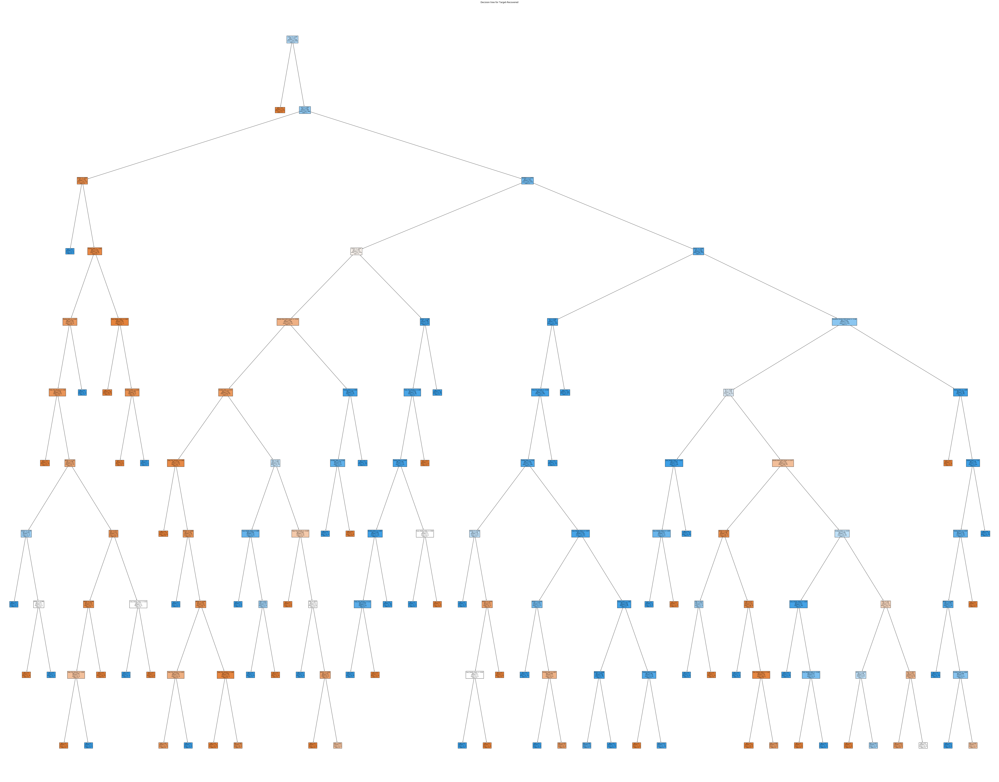

In [133]:
clf = DecisionTreeClassifier(max_depth=10)
accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')

clf.fit(x_train,y_train)

fig = plt.figure(figsize=(100,80))
_ = tree.plot_tree(clf, 
                   feature_names=allFeatures,  
                   class_names=["0","1"],
                   filled=True)
plt.title('Decision tree for Target-Recovered')

<p> From the above tree we can see an interesting observation about the data that the first splitting condition is "Long_" <=-1.166, its gini =0.47 and has 1104 samples which are split in values[416,588] and class=0. The furthe spliis on "Lat" which further splits on basis of 'Active' and  'SexRaio'. (The in the report may appear unclear but the conditions are visible on zooming in, in the notebook) </p>

### Of all the parameter d for maxdepth [3, 5, 10, None], the best accuracy is given by max_depth = 7 (shown above in graph)

In [134]:
clf = DecisionTreeClassifier(max_depth=7)
clf.fit(x_train,y_train)

y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.894927536231884
AUC 0.8830681818181818
f1score 0.9183098591549295


### Exporting model to .joblib

In [135]:
from joblib import dump, load
dump(clf, 'clf_DT_Recovered.joblib') 

['clf_DT_Recovered.joblib']

### Storing metrics in dataframe for model comparison later in CM7

In [136]:
df_interpretability_recovered.loc['Decision Trees Classifier', 'Accuracy'] = accuracy
df_interpretability_recovered.loc['Decision Trees Classifier', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_recovered.loc['Decision Trees Classifier', 'F1-Score'] = f_score
df_interpretability_recovered

,Accuracy,AUC,F1-Score
Decision Trees Classifier,0.894928,0.883068,0.91831
Random Forest Classifier,NaN,NaN,NaN
Gradient Tree Boosting,NaN,NaN,NaN
Naive Bayes,NaN,NaN,NaN


### grow until leaf contains 2 datapoints

Text(0.5, 1.0, 'Decision tree with leaf contaning 2 datapoints for Target-Recovered')

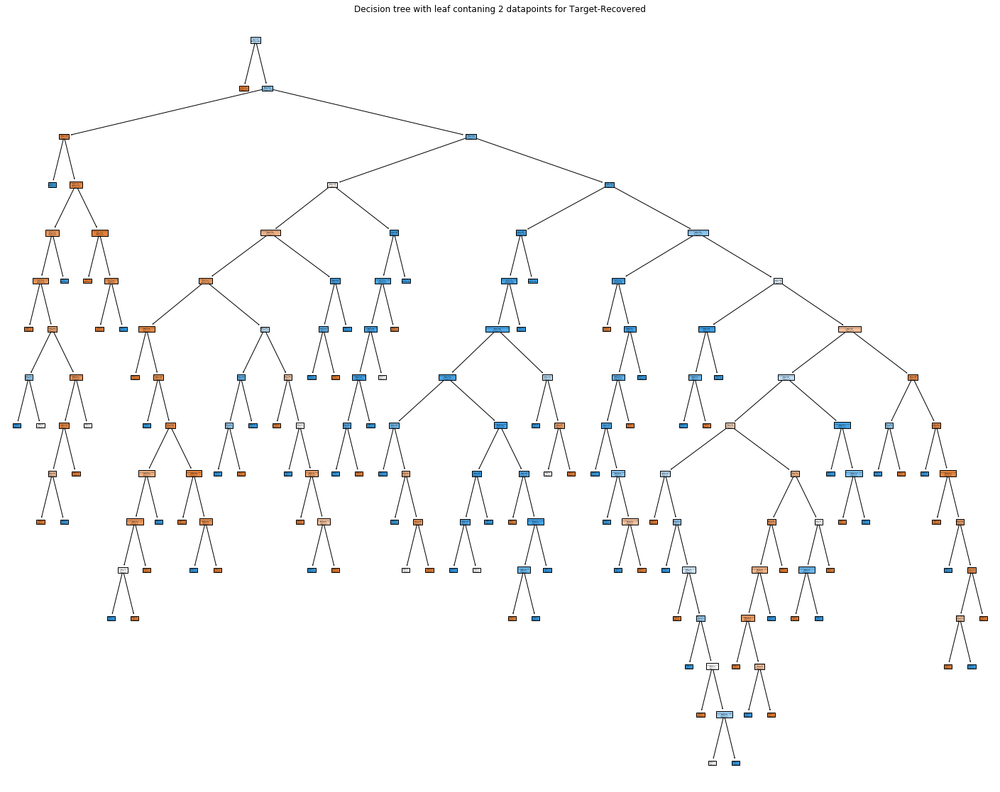

In [137]:
clf = DecisionTreeClassifier(max_depth=None,min_samples_split=3)
accuracy = cross_val_score(clf, x_train, y_train, cv=10, scoring='accuracy')

clf.fit(x_train,y_train)

fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(clf, 
                   feature_names=allFeatures,  
                   class_names=["0","1"],
                   filled=True)
plt.title('Decision tree with leaf contaning 2 datapoints for Target-Recovered')

<p> The visualization above although doesnt allow us to see the split features and values due to the size constraints in this report but they do show us that how the tree is divided and the number of nodes in each leaf.</p>

---
---

In [138]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# CM4 Random Forest Classifier 
## Confirmed
### Normal Dataset

<p>For this question we have chosen the value of k as 10 for kfold cross validation</p>

In [139]:
x_train,x_test,y_train,y_test=train_test_split(x_confirmed, y_confirmed_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(RandomForestClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': [3, 5, 10, None],
                         'n_estimators': [5, 10, 50, 150, 200]})

In [140]:
df_parameters_confirmed = pd.DataFrame(clf.cv_results_)
df_parameters_confirmed;

In [141]:
df1=df_parameters_confirmed[['param_max_depth', 'param_n_estimators','mean_test_score','rank_test_score'
]]
df1

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.866413,20
1,3,10,0.885237,19
2,3,50,0.894643,16
3,3,150,0.891827,17
4,3,200,0.888532,18
5,5,5,0.919592,15
6,5,10,0.944977,14
7,5,50,0.950151,13
8,5,150,0.952498,12
9,5,200,0.953439,11


In [142]:
df2=df1.pivot(index='param_max_depth', columns='param_n_estimators', values='mean_test_score')
df2

param_n_estimators,5,10,50,150,200
param_max_depth,,,,,
NaN,0.977898,0.977895,0.979776,0.981186,0.982128
3.0,0.866413,0.885237,0.894643,0.891827,0.888532
5.0,0.919592,0.944977,0.950151,0.952498,0.953439
10.0,0.961437,0.963317,0.966138,0.963315,0.963786


(4.0, 0.0)

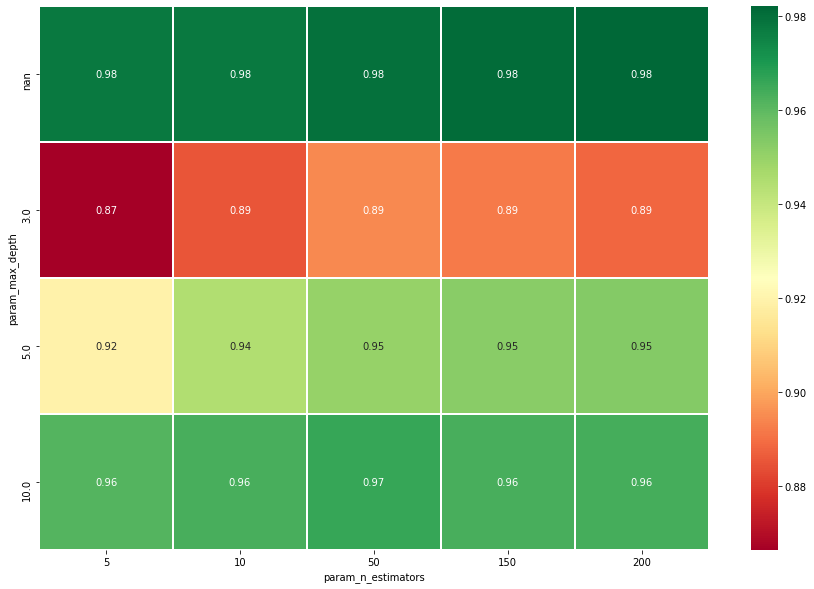

In [143]:
fig, ax = plt.subplots(figsize=(15,10))
g=sns.heatmap(df2,annot=True,cmap="RdYlGn",linewidths=.5, ax=ax)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<p> Based on the heat map the best accuracy is offered when max_depth is set to 'None' and n_estimators are in high values of 150 or 200

### Best Parameters n_estimators=200, max_depth=None

In [144]:
clf=RandomForestClassifier(n_estimators=200, max_depth=None)
clf.fit(x_train,y_train)
        
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9699248120300752
AUC 0.969811320754717
f1score 0.9688715953307393


In [145]:
from joblib import dump, load
dump(clf, 'clf_RFC_Confirmed_ND.joblib') 

['clf_RFC_Confirmed_ND.joblib']

In [146]:
df_interpretability_confirmed.loc['Random Forest Classifier', 'Accuracy'] = accuracy
df_interpretability_confirmed.loc['Random Forest Classifier', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_confirmed.loc['Random Forest Classifier', 'F1-Score'] = f_score
df_interpretability_confirmed;

---

In [147]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Deaths
### Normal Dataset

In [148]:
arr = np.array(y_deaths)
y_deaths_newarr = arr.reshape(y_deaths.shape[0],)
y_deaths_newarr.shape

(2488,)

In [149]:
x_train,x_test,y_train,y_test=train_test_split(x_deaths, y_deaths_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(RandomForestClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
# clf.cv_results_

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': [3, 5, 10, None],
                         'n_estimators': [5, 10, 50, 150, 200]})

In [150]:
df_parameters_deaths = pd.DataFrame(clf.cv_results_)
df_parameters_deaths;

In [151]:
df1=df_parameters_deaths[['param_max_depth', 'param_n_estimators','mean_test_score','rank_test_score'
]]
df1

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.808040,17
1,3,10,0.820101,16
2,3,50,0.806533,18
3,3,150,0.806533,19
4,3,200,0.805025,20
5,5,5,0.852764,15
6,5,10,0.854271,14
7,5,50,0.857286,13
8,5,150,0.859799,11
9,5,200,0.858794,12


In [152]:
df2=df1.pivot(index='param_max_depth', columns='param_n_estimators', values='mean_test_score')
df2

param_n_estimators,5,10,50,150,200
param_max_depth,,,,,
NaN,0.945729,0.942211,0.947236,0.947236,0.947236
3.0,0.808040,0.820101,0.806533,0.806533,0.805025
5.0,0.852764,0.854271,0.857286,0.859799,0.858794
10.0,0.933668,0.937688,0.935176,0.931156,0.929648


(4.0, 0.0)

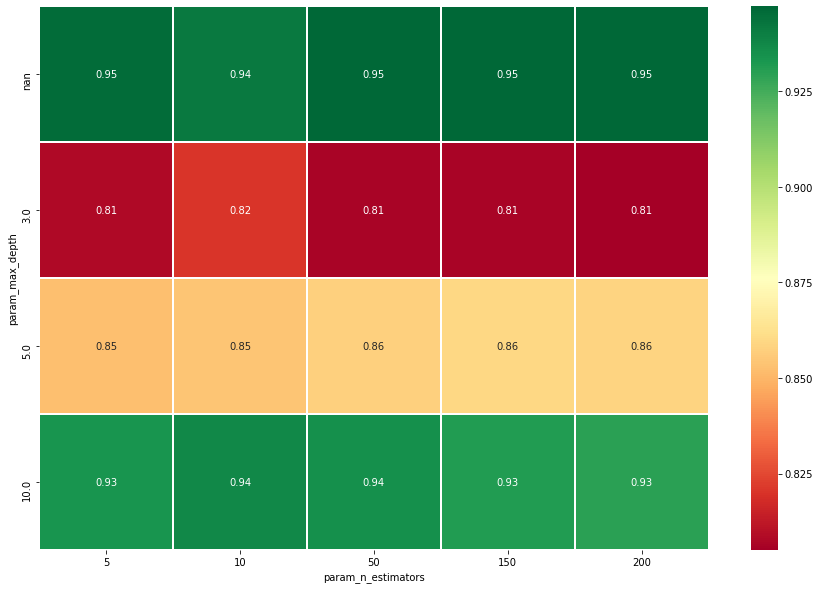

In [153]:
fig, ax = plt.subplots(figsize=(15,10))
g=sns.heatmap(df2,annot=True,cmap="RdYlGn",linewidths=.5, ax=ax)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<p> Based on the heat map the best accuracy is offered when max_depth is set to 'None' and n_estimators are in high values of 150 or 200. The worst results are when max_depth=3.

In [154]:
clf=RandomForestClassifier(n_estimators=200, max_depth=None)
clf.fit(x_train,y_train)
        
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9578313253012049
AUC 0.958984375
f1score 0.9572301425661914


In [155]:
from joblib import dump, load
dump(clf, 'clf_RFC_Deaths_ND.joblib') 

['clf_RFC_Deaths_ND.joblib']

In [156]:
df_interpretability_deaths.loc['Random Forest Classifier', 'Accuracy'] = accuracy
df_interpretability_deaths.loc['Random Forest Classifier', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_deaths.loc['Random Forest Classifier', 'F1-Score'] = f_score
df_interpretability_deaths;

---

In [157]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Recovered
### Normal Dataset

In [158]:
arr = np.array(y_recovered)
y_recovered_newarr = arr.reshape(y_recovered.shape[0],)
y_recovered_newarr.shape

(1380,)

In [159]:
x_train,x_test,y_train,y_test=train_test_split(x_recovered, y_recovered_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(RandomForestClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
# clf.cv_results_

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': [3, 5, 10, None],
                         'n_estimators': [5, 10, 50, 150, 200]})

In [160]:
df_parameters_recovered = pd.DataFrame(clf.cv_results_)
df_parameters_recovered;

In [161]:
df1=df_parameters_recovered[['param_max_depth', 'param_n_estimators','mean_test_score','rank_test_score'
]]
df1

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.835142,17
1,3,10,0.836039,16
2,3,50,0.826047,18
3,3,150,0.821522,19
4,3,200,0.817902,20
5,5,5,0.897618,15
6,5,10,0.906656,14
7,5,50,0.910304,11
8,5,150,0.906680,13
9,5,200,0.909399,12


In [162]:
df2=df1.pivot(index='param_max_depth', columns='param_n_estimators', values='mean_test_score')
df2

param_n_estimators,5,10,50,150,200
param_max_depth,,,,,
NaN,0.920267,0.917548,0.920271,0.923896,0.921176
3.0,0.835142,0.836039,0.826047,0.821522,0.817902
5.0,0.897618,0.906656,0.910304,0.906680,0.909399
10.0,0.926602,0.924788,0.928408,0.929317,0.928412


(4.0, 0.0)

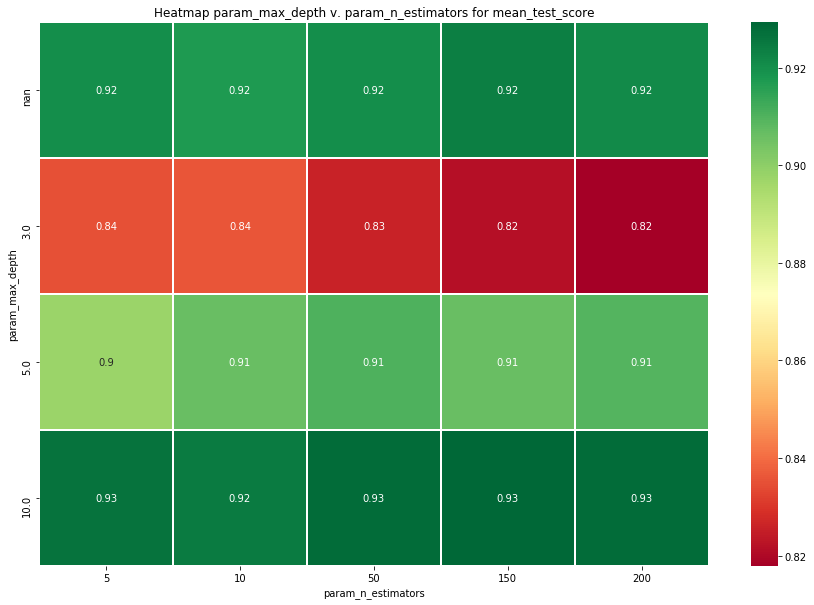

In [163]:
fig, ax = plt.subplots(figsize=(15,10))
plt.title('Heatmap param_max_depth v. param_n_estimators for mean_test_score')
g=sns.heatmap(df2,annot=True,cmap="RdYlGn",linewidths=.5, ax=ax)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<p> Based on the heat map the best accuracy is offered when max_depth is set to 10 and n_estimators are in values of 50, 150, 200. The worst results are when max_depth=3.

### Best Accuracy at n_estimators=150 and max_depth=10

In [164]:
clf=RandomForestClassifier(n_estimators=150, max_depth=10)
clf.fit(x_train,y_train)
        
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.927536231884058
AUC 0.9172727272727272
f1score 0.9438202247191012


In [165]:
from joblib import dump, load
dump(clf, 'clf_RFC_Recovered_ND.joblib') 

['clf_RFC_Recovered_ND.joblib']

In [166]:
df_interpretability_recovered.loc['Random Forest Classifier', 'Accuracy'] = accuracy
df_interpretability_recovered.loc['Random Forest Classifier', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_recovered.loc['Random Forest Classifier', 'F1-Score'] = f_score
df_interpretability_recovered;

---

In [167]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Confirmed
### PCA dataset

In [168]:
features = ['PC1', 'PC2','PC3','PC4','PC5','PC6','PC7','PC8']
x_confirmed_pca = principalDf_confirmed.loc[:, features].values
y_confirmed_pca = principalDf_confirmed.loc[:,['Confirmed']].values

In [169]:
arr = np.array(y_confirmed_pca)
y_confirmed_pca_newarr = arr.reshape(y_confirmed_pca.shape[0],)
y_confirmed_pca_newarr.shape

(2658,)

In [170]:
x_train,x_test,y_train,y_test=train_test_split(x_confirmed_pca, y_confirmed_pca_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(RandomForestClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': [3, 5, 10, None],
                         'n_estimators': [5, 10, 50, 150, 200]})

In [171]:
df_parameters_confirmed_pca = pd.DataFrame(clf.cv_results_)
df_parameters_confirmed_pca[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.857949,20
1,3,10,0.893231,18
2,3,50,0.890873,19
3,3,150,0.906395,17
4,3,200,0.908276,16
5,5,5,0.927559,15
6,5,10,0.941204,14
7,5,50,0.944029,13
8,5,150,0.946850,12
9,5,200,0.948262,11


In [172]:
df1=df_parameters_confirmed_pca[['param_max_depth', 'param_n_estimators','mean_test_score','rank_test_score'
]]
df2=df1.pivot(index='param_max_depth', columns='param_n_estimators', values='mean_test_score')
df2

param_n_estimators,5,10,50,150,200
param_max_depth,,,,,
NaN,0.983068,0.983065,0.986360,0.987301,0.986830
3.0,0.857949,0.893231,0.890873,0.906395,0.908276
5.0,0.927559,0.941204,0.944029,0.946850,0.948262
10.0,0.972720,0.972721,0.975539,0.973661,0.973190


(4.0, 0.0)

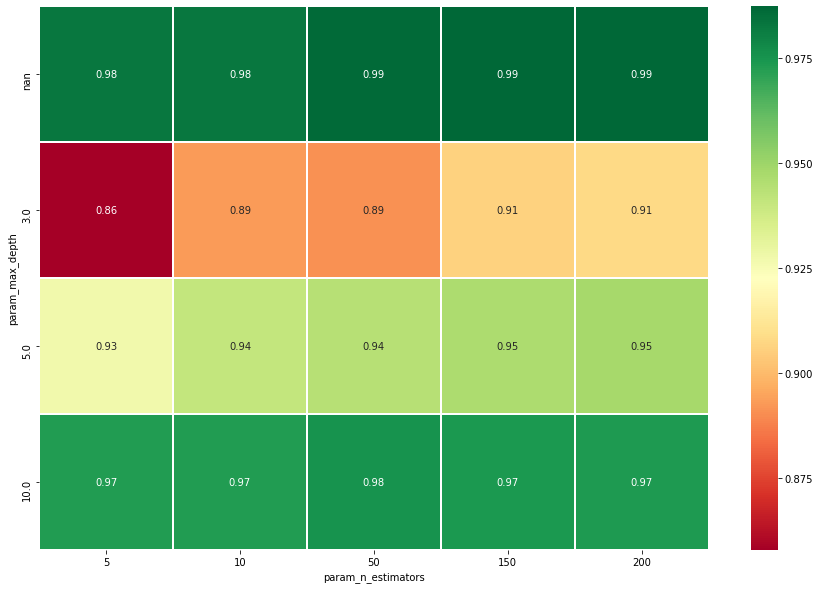

In [173]:
fig, ax = plt.subplots(figsize=(15,10))
g=sns.heatmap(df2,annot=True,cmap="RdYlGn",linewidths=.5, ax=ax)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<p> Based on the heat map the best accuracy is offered when max_depth is set to 'None' and n_estimators are in values of  150 or 200. The worst results are when max_depth=3.

In [174]:
clf=RandomForestClassifier(max_depth=None, n_estimators=200)
clf.fit(x_train,y_train)
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.981203007518797
AUC 0.9811320754716981
f1score 0.9807692307692307


In [175]:
from joblib import dump, load
dump(clf, 'clf_RFC_Confirmed_PCA.joblib') 

['clf_RFC_Confirmed_PCA.joblib']

---

In [176]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Deaths
### PCA dataset

In [177]:
principalDf_deaths

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Deaths
0,0.838112,-0.640460,-1.694588,-0.606326,0.176650,0.401679,0.494965,0.127632,0
1,-0.123620,-0.784851,-2.479154,3.266583,0.056047,-1.158585,0.046412,0.093545,0
2,1.148847,-0.925947,-0.561029,-0.214984,-0.189991,-0.863490,-0.236859,-0.472061,0
3,-2.081615,0.268763,-0.396155,-0.048793,0.154611,0.271165,-0.152859,-0.313796,0
4,-4.024722,1.785172,1.915059,1.529074,-0.400143,0.185418,-0.305218,0.471326,0
...,...,...,...,...,...,...,...,...,...
2483,1.636210,0.083945,-0.581247,-0.161640,-0.246242,0.480883,0.851232,0.705197,1
2484,-2.297366,0.692852,1.688806,-1.286980,0.464598,-1.114342,0.413956,-0.444035,1
2485,1.130214,-0.890072,-0.545995,-0.234658,-0.170437,-0.867257,-0.233095,-0.442134,1
2486,3.609240,-1.155160,1.067420,-0.198400,-0.191529,-0.856245,-1.803927,0.140194,1


In [178]:
x_deaths_pca = principalDf_deaths.loc[:, features].values
y_deaths_pca = principalDf_deaths.loc[:,['Deaths']].values

In [179]:
arr = np.array(y_deaths_pca)
y_deaths_pca_newarr = arr.reshape(y_deaths_pca.shape[0],)
y_deaths_pca_newarr.shape

(2488,)

In [180]:
x_train,x_test,y_train,y_test=train_test_split(x_deaths_pca, y_deaths_pca_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(RandomForestClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': [3, 5, 10, None],
                         'n_estimators': [5, 10, 50, 150, 200]})

In [181]:
df_parameters_deaths_pca = pd.DataFrame(clf.cv_results_)
df_parameters_deaths_pca[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.768844,19
1,3,10,0.752764,20
2,3,50,0.823618,16
3,3,150,0.823116,17
4,3,200,0.818593,18
5,5,5,0.843216,15
6,5,10,0.852764,14
7,5,50,0.867337,13
8,5,150,0.867839,11
9,5,200,0.867839,11


<p> The best paramter for the pca DATASET is given below. It produces an accuracy of 0.966245.

In [182]:
df1=df_parameters_deaths_pca[['param_max_depth', 'param_n_estimators','mean_test_score','rank_test_score'
]]
df2=df1.pivot(index='param_max_depth', columns='param_n_estimators', values='mean_test_score')
df2

param_n_estimators,5,10,50,150,200
param_max_depth,,,,,
NaN,0.952764,0.944221,0.956784,0.957286,0.957789
3.0,0.768844,0.752764,0.823618,0.823116,0.818593
5.0,0.843216,0.852764,0.867337,0.867839,0.867839
10.0,0.930151,0.938693,0.937688,0.938191,0.935176


(4.0, 0.0)

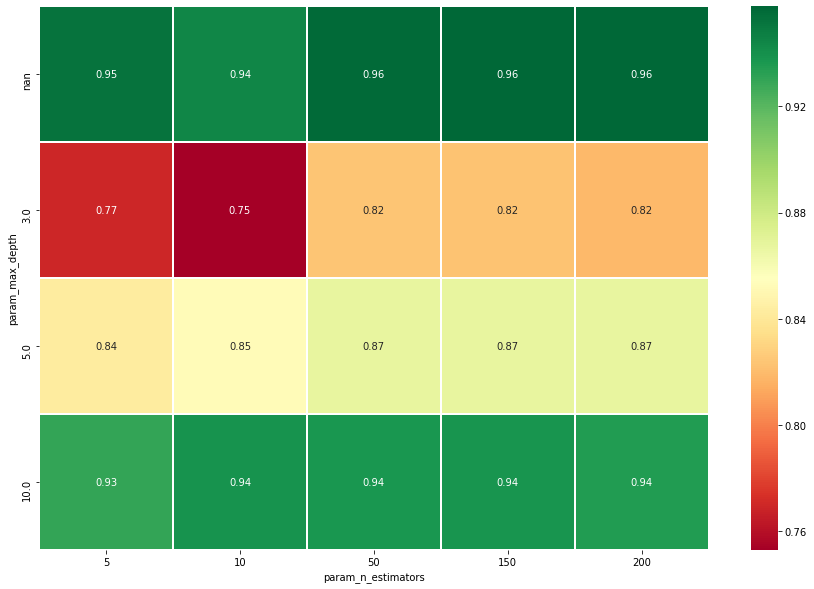

In [183]:
fig, ax = plt.subplots(figsize=(15,10))
g=sns.heatmap(df2,annot=True,cmap="RdYlGn",linewidths=.5, ax=ax)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<p> Based on the heat map the best accuracy is offered when max_depth is set to 'None' and n_estimators are in values of  150 or 200. The worst results are when max_depth=3.

In [184]:
clf=RandomForestClassifier(max_depth=None, n_estimators=200)
clf.fit(x_train,y_train)
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9578313253012049
AUC 0.958984375
f1score 0.9572301425661914


In [185]:
from joblib import dump, load
dump(clf, 'clf_RFC_Deaths_PCA.joblib') 

['clf_RFC_Deaths_PCA.joblib']

---

In [186]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Recovered
### PCA dataset

In [187]:
principalDf_recovered

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Recovered
0,0.167289,-0.202046,-2.123755,-0.389615,0.279090,-0.300402,0.255593,0.134441,0
1,-4.792232,1.593028,3.945457,1.752560,-1.045291,0.054170,0.162663,-0.637015,0
2,-0.328110,1.133464,-1.277333,0.449386,0.396552,0.371481,-0.731861,0.020160,1
3,-0.463401,-0.359201,-1.191848,-0.345832,0.172995,0.222039,-0.084106,0.369486,1
4,4.516027,6.171078,1.154601,1.408415,-0.075265,-0.668954,0.226275,-0.052008,0
...,...,...,...,...,...,...,...,...,...
1375,-0.357129,-1.682012,0.613557,0.833157,-2.019286,-0.308802,0.850615,1.044129,1
1376,0.809592,0.124127,-0.808299,0.107912,-0.385922,-0.786765,0.481422,-0.305651,1
1377,-0.457245,-0.850883,-0.068361,-0.272373,-0.282510,0.214476,0.277300,0.430069,1
1378,-0.814127,0.335684,0.795745,-1.049347,0.381291,-0.440125,0.519021,-0.533402,1


In [188]:
x_recovered_pca = principalDf_recovered.loc[:, features].values
y_recovered_pca = principalDf_recovered.loc[:,['Recovered']].values
y_recovered_pca.shape

(1380, 1)

In [189]:
arr = np.array(y_recovered_pca)
y_recovered_pca_newarr = arr.reshape(y_recovered_pca.shape[0],)
y_recovered_pca_newarr.shape

(1380,)

In [190]:
x_train,x_test,y_train,y_test=train_test_split(x_recovered_pca, y_recovered_pca_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(RandomForestClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': [3, 5, 10, None],
                         'n_estimators': [5, 10, 50, 150, 200]})

In [191]:
df_parameters_recovered_pca = pd.DataFrame(clf.cv_results_)
df_parameters_recovered_pca[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.829708,20
1,3,10,0.865911,16
2,3,50,0.843295,19
3,3,150,0.847812,17
4,3,200,0.846886,18
5,5,5,0.893089,15
6,5,10,0.897618,13
7,5,50,0.898540,11
8,5,150,0.898540,11
9,5,200,0.896730,14


In [192]:
bestValue = df_parameters_deaths_pca[df_parameters_deaths_pca['rank_test_score'] == 1]
bestValue

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
19,0.845092,0.052419,0.049314,0.007764,None,200,"{'max_depth': None, 'n_estimators': 200}",0.967337,0.954774,0.959799,0.959799,0.947236,0.957789,0.006629,1


In [193]:
df1=df_parameters_deaths_pca[['param_max_depth', 'param_n_estimators','mean_test_score','rank_test_score'
]]
df2=df1.pivot(index='param_max_depth', columns='param_n_estimators', values='mean_test_score')
df2

param_n_estimators,5,10,50,150,200
param_max_depth,,,,,
NaN,0.952764,0.944221,0.956784,0.957286,0.957789
3.0,0.768844,0.752764,0.823618,0.823116,0.818593
5.0,0.843216,0.852764,0.867337,0.867839,0.867839
10.0,0.930151,0.938693,0.937688,0.938191,0.935176


(4.0, 0.0)

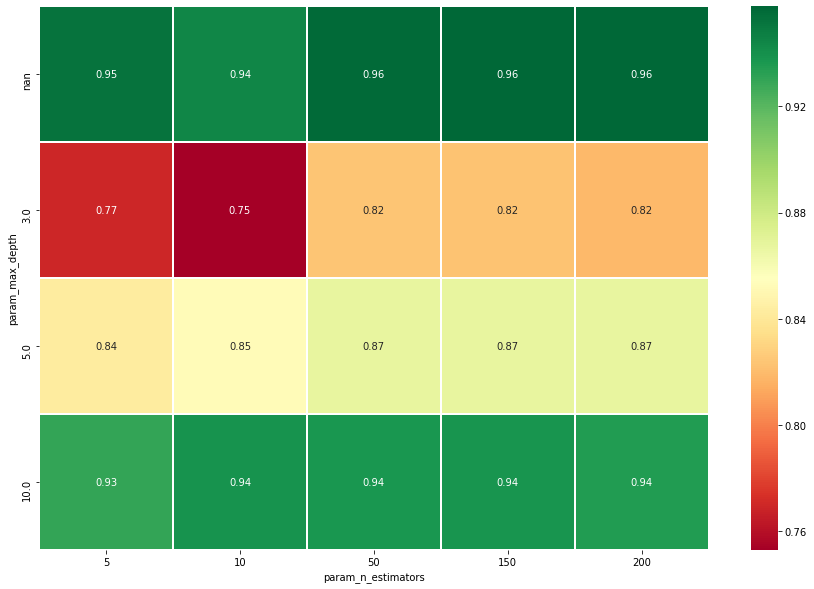

In [194]:
fig, ax = plt.subplots(figsize=(15,10))
g=sns.heatmap(df2,annot=True,cmap="RdYlGn",linewidths=.5, ax=ax)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<p> Based on the heat map the best accuracy is offered when max_depth is set to 'None' and n_estimators are in values of  150 or 200. The worst results are when max_depth=3.

In [195]:
clf=RandomForestClassifier(max_depth=10, n_estimators=50)
clf.fit(x_train,y_train)
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.927536231884058
AUC 0.9237500000000001
f1score 0.9428571428571428


In [196]:
from joblib import dump, load
dump(clf, 'clf_RFC_Recovered_PCA.joblib') 

['clf_RFC_Recovered_PCA.joblib']

#### On implementing Random Forest classifier using various parameters for the number of trees and maximum depth of trees. For the dataset where the target label is 'Confirmed', the kcross validation for the normal dataset is 98.21 whereas for PCA it is 98.73. For Target label=' Death', normal dataset validation accuracy is 94.72 but for PCA it is 95.77. For 'Recovered', normal dataset accuracy is 92.93 and PCA is 92.84.The general trend that can be seen is that the PCA helps us to get a better accuracy score as compared to Random forest classification model on Normal dataset, a reason for this can be that PCA by reducing the number of features reduces overfitting

In [286]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

---
---

# CM5 Gradient Tree Boosting
## Confirmed
### Normal Dataset

In [197]:
x_train,x_test,y_train,y_test=train_test_split(x_confirmed, y_confirmed_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(GradientBoostingClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
clf.cv_results_;

In [198]:
df_parameters_confirmed = pd.DataFrame(clf.cv_results_)
df_parameters_confirmed[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.876770,20
1,3,10,0.908287,19
2,3,50,0.953444,16
3,3,150,0.978835,12
4,3,200,0.982126,11
5,5,5,0.929921,18
6,5,10,0.945446,17
7,5,50,0.976953,13
8,5,150,0.985418,2
9,5,200,0.985889,1


In [199]:
df_parameters_confirmed_temp=df_parameters_confirmed[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_confirmed_temp = df_parameters_confirmed_temp[df_parameters_confirmed_temp['param_max_depth'] == 3]
df_parameters_confirmed_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.876770,20
1,3,10,0.908287,19
2,3,50,0.953444,16
3,3,150,0.978835,12
4,3,200,0.982126,11


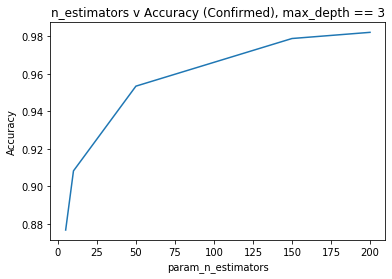

0    0.876770
1    0.908287
2    0.953444
3    0.978835
4    0.982126
Name: mean_test_score, dtype: float64

In [200]:
plt.plot(df_parameters_confirmed_temp['param_n_estimators'].values,df_parameters_confirmed_temp['mean_test_score'].values)
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Confirmed), max_depth == 3")
plt.show()
df_parameters_confirmed_temp['mean_test_score']

In [201]:
df_parameters_confirmed_temp=df_parameters_confirmed[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_confirmed_temp = df_parameters_confirmed_temp[df_parameters_confirmed_temp['param_max_depth'] == 5]
df_parameters_confirmed_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
5,5,5,0.929921,18
6,5,10,0.945446,17
7,5,50,0.976953,13
8,5,150,0.985418,2
9,5,200,0.985889,1


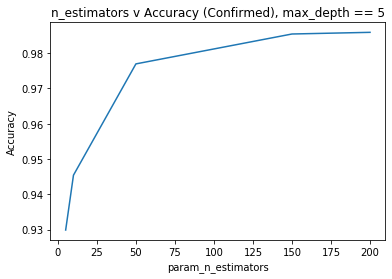

5    0.929921
6    0.945446
7    0.976953
8    0.985418
9    0.985889
Name: mean_test_score, dtype: float64

In [202]:
plt.plot(df_parameters_confirmed_temp['param_n_estimators'].values,df_parameters_confirmed_temp['mean_test_score'].values)
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Confirmed), max_depth == 5")
plt.show()
df_parameters_confirmed_temp['mean_test_score']

In [203]:
df_parameters_confirmed_temp=df_parameters_confirmed[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_confirmed_temp = df_parameters_confirmed_temp[df_parameters_confirmed_temp['param_max_depth'] == 10]
df_parameters_confirmed_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
10,10,5,0.969428,15
11,10,10,0.969899,14
12,10,50,0.982598,10
13,10,150,0.984947,3
14,10,200,0.984947,3


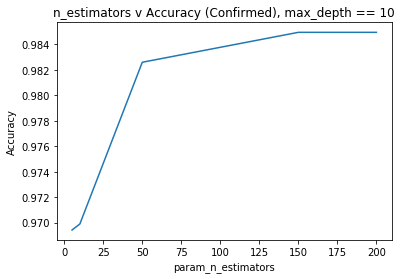

10    0.969428
11    0.969899
12    0.982598
13    0.984947
14    0.984947
Name: mean_test_score, dtype: float64

In [204]:
plt.plot(df_parameters_confirmed_temp['param_n_estimators'].values,df_parameters_confirmed_temp['mean_test_score'].values)
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Confirmed), max_depth == 10")
plt.show()
df_parameters_confirmed_temp['mean_test_score']

In [205]:
df_parameters_confirmed_temp=df_parameters_confirmed[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_confirmed_temp=df_parameters_confirmed_temp[df_parameters_confirmed_temp['param_max_depth'].isnull()]
df_parameters_confirmed_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
15,None,5,0.983537,7
16,None,10,0.984007,5
17,None,50,0.983538,6
18,None,150,0.983069,8
19,None,200,0.983069,8


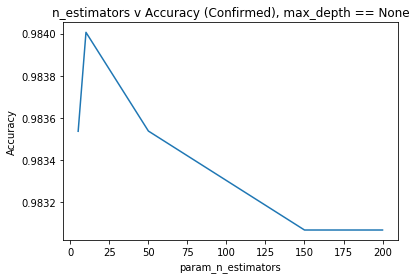

15    0.983537
16    0.984007
17    0.983538
18    0.983069
19    0.983069
Name: mean_test_score, dtype: float64

In [206]:
plt.plot(df_parameters_confirmed_temp['param_n_estimators'].values,df_parameters_confirmed_temp['mean_test_score'].values)
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Confirmed), max_depth == None")
plt.show()
df_parameters_confirmed_temp['mean_test_score']

### Best Parameter param_max_depth=10 param_n_estimators=200

In [207]:
clf = GradientBoostingClassifier(random_state=0, n_estimators=200, max_depth=10)

clf.fit(x_train,y_train)        
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9849624060150376
AUC 0.9849056603773585
f1score 0.9846743295019157


In [208]:
from joblib import dump, load
dump(clf, 'clf_GBC_Confirmed.joblib') 

['clf_GBC_Confirmed.joblib']

In [209]:
df_interpretability_confirmed.loc['Gradient Tree Boosting', 'Accuracy'] = accuracy
df_interpretability_confirmed.loc['Gradient Tree Boosting', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_confirmed.loc['Gradient Tree Boosting', 'F1-Score'] = f_score
df_interpretability_confirmed;

In [210]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Deaths
### Normal Dataset

In [211]:
x_train,x_test,y_train,y_test=train_test_split(x_deaths, y_deaths_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(GradientBoostingClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
clf.cv_results_;

In [212]:
df_parameters_deaths = pd.DataFrame(clf.cv_results_)
df_parameters_deaths[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.816080,20
1,3,10,0.828141,19
2,3,50,0.876884,17
3,3,150,0.918593,15
4,3,200,0.937688,12
5,5,5,0.876884,17
6,5,10,0.885930,16
7,5,50,0.933166,14
8,5,150,0.955779,5
9,5,200,0.958291,2


In [213]:
df_parameters_deaths_temp=df_parameters_deaths[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_deaths_temp = df_parameters_deaths_temp[df_parameters_deaths_temp['param_max_depth'] == 3]
df_parameters_deaths_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.816080,20
1,3,10,0.828141,19
2,3,50,0.876884,17
3,3,150,0.918593,15
4,3,200,0.937688,12


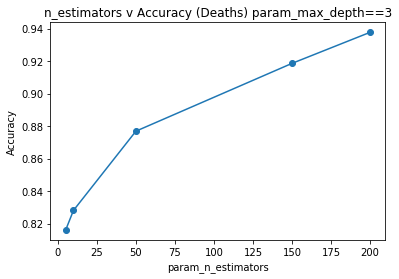

0    0.816080
1    0.828141
2    0.876884
3    0.918593
4    0.937688
Name: mean_test_score, dtype: float64

In [214]:
plt.plot(df_parameters_deaths_temp['param_n_estimators'].values,df_parameters_deaths_temp['mean_test_score'].values, marker='o')
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Deaths) param_max_depth==3")
plt.show()
df_parameters_deaths_temp['mean_test_score']

In [215]:
df_parameters_deaths_temp=df_parameters_deaths[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_deaths_temp = df_parameters_deaths_temp[df_parameters_deaths_temp['param_max_depth'] == 5]
df_parameters_deaths_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
5,5,5,0.876884,17
6,5,10,0.885930,16
7,5,50,0.933166,14
8,5,150,0.955779,5
9,5,200,0.958291,2


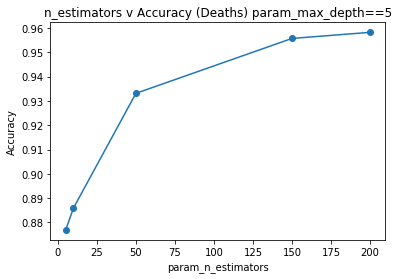

5    0.876884
6    0.885930
7    0.933166
8    0.955779
9    0.958291
Name: mean_test_score, dtype: float64

In [216]:
plt.plot(df_parameters_deaths_temp['param_n_estimators'].values,df_parameters_deaths_temp['mean_test_score'].values, marker='o')
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Deaths) param_max_depth==5")
plt.show()
df_parameters_deaths_temp['mean_test_score']

In [217]:
df_parameters_deaths_temp=df_parameters_deaths[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_deaths_temp = df_parameters_deaths_temp[df_parameters_deaths_temp['param_max_depth'] == 10]
df_parameters_deaths_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
10,10,5,0.936181,13
11,10,10,0.939196,11
12,10,50,0.956784,3
13,10,150,0.956281,4
14,10,200,0.958794,1


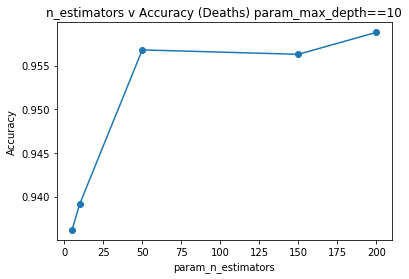

10    0.936181
11    0.939196
12    0.956784
13    0.956281
14    0.958794
Name: mean_test_score, dtype: float64

In [218]:
plt.plot(df_parameters_deaths_temp['param_n_estimators'].values,df_parameters_deaths_temp['mean_test_score'].values, marker='o')
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Deaths) param_max_depth==10")
plt.show()
df_parameters_deaths_temp['mean_test_score']

In [219]:
df_parameters_deaths_temp=df_parameters_deaths[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_deaths_temp=df_parameters_deaths_temp[df_parameters_deaths_temp['param_max_depth'].isnull()]
df_parameters_deaths_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
15,None,5,0.954271,8
16,None,10,0.954774,7
17,None,50,0.955276,6
18,None,150,0.954271,8
19,None,200,0.953769,10


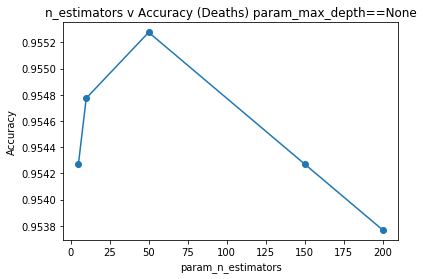

15    0.954271
16    0.954774
17    0.955276
18    0.954271
19    0.953769
Name: mean_test_score, dtype: float64

In [220]:
plt.plot(df_parameters_deaths_temp['param_n_estimators'].values,df_parameters_deaths_temp['mean_test_score'].values, marker='o')
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Deaths) param_max_depth==None")
plt.show()
df_parameters_deaths_temp['mean_test_score']

### Best Parameter param_max_depth=10 param_n_estimators=200

In [221]:
clf = GradientBoostingClassifier(random_state=0,max_depth=10,n_estimators=200)

clf.fit(x_train,y_train)        
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9598393574297188
AUC 0.9609375
f1score 0.959349593495935


In [222]:
from joblib import dump, load
dump(clf, 'clf_GBC_Deaths.joblib') 

['clf_GBC_Deaths.joblib']

In [223]:
df_interpretability_deaths.loc['Gradient Tree Boosting', 'Accuracy'] = accuracy
df_interpretability_deaths.loc['Gradient Tree Boosting', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_deaths.loc['Gradient Tree Boosting', 'F1-Score'] = f_score
df_interpretability_deaths;

In [224]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Recovered
### Normal Dataset

In [225]:
x_train,x_test,y_train,y_test=train_test_split(x_recovered, y_recovered_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(GradientBoostingClassifier(random_state=0),{'max_depth':[3, 5, 10, None],'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
clf.cv_results_;

In [226]:
df_parameters_recovered = pd.DataFrame(clf.cv_results_)
df_parameters_recovered[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.815187,20
1,3,10,0.845956,19
2,3,50,0.931127,1
3,3,150,0.930218,2
4,3,200,0.923887,6
5,5,5,0.902143,18
6,5,10,0.926602,4
7,5,50,0.928408,3
8,5,150,0.916652,14
9,5,200,0.917557,10


In [227]:
df_parameters_recovered_temp=df_parameters_recovered[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_recovered_temp = df_parameters_recovered_temp[df_parameters_recovered_temp['param_max_depth'] == 3]
df_parameters_recovered_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,3,5,0.815187,20
1,3,10,0.845956,19
2,3,50,0.931127,1
3,3,150,0.930218,2
4,3,200,0.923887,6


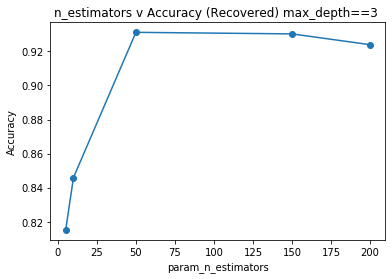

0    0.815187
1    0.845956
2    0.931127
3    0.930218
4    0.923887
Name: mean_test_score, dtype: float64

In [228]:
plt.plot(df_parameters_recovered_temp['param_n_estimators'].values,df_parameters_recovered_temp['mean_test_score'].values,marker='o')
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Recovered) max_depth==3 ")
plt.show()
df_parameters_recovered_temp['mean_test_score']

In [229]:
df_parameters_recovered_temp=df_parameters_recovered[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_recovered_temp = df_parameters_recovered_temp[df_parameters_recovered_temp['param_max_depth'] == 5]
df_parameters_recovered_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
5,5,5,0.902143,18
6,5,10,0.926602,4
7,5,50,0.928408,3
8,5,150,0.916652,14
9,5,200,0.917557,10


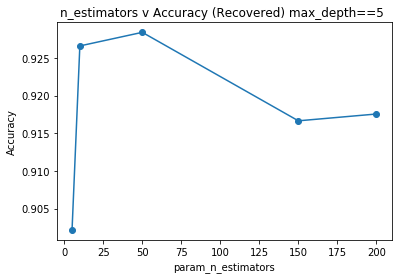

5    0.902143
6    0.926602
7    0.928408
8    0.916652
9    0.917557
Name: mean_test_score, dtype: float64

In [230]:
plt.plot(df_parameters_recovered_temp['param_n_estimators'].values,df_parameters_recovered_temp['mean_test_score'].values,marker='o')
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Recovered) max_depth==5 ")
plt.show()
df_parameters_recovered_temp['mean_test_score']

In [231]:
df_parameters_recovered_temp=df_parameters_recovered[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_recovered_temp = df_parameters_recovered_temp[df_parameters_recovered_temp['param_max_depth'] == 10]
df_parameters_recovered_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
10,10,5,0.922086,7
11,10,10,0.923900,5
12,10,50,0.916656,12
13,10,150,0.915747,16
14,10,200,0.915747,16


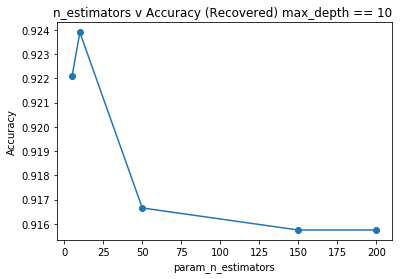

10    0.922086
11    0.923900
12    0.916656
13    0.915747
14    0.915747
Name: mean_test_score, dtype: float64

In [232]:
plt.plot(df_parameters_recovered_temp['param_n_estimators'].values,df_parameters_recovered_temp['mean_test_score'].values,marker='o')
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Recovered) max_depth == 10 ")
plt.show()
df_parameters_recovered_temp['mean_test_score']

In [233]:
df_parameters_recovered_temp=df_parameters_recovered[['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']]
df_parameters_recovered_temp=df_parameters_recovered_temp[df_parameters_recovered_temp['param_max_depth'].isnull()]
df_parameters_recovered_temp

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
15,None,5,0.916656,12
16,None,10,0.915751,15
17,None,50,0.918466,8
18,None,150,0.918466,8
19,None,200,0.917557,10


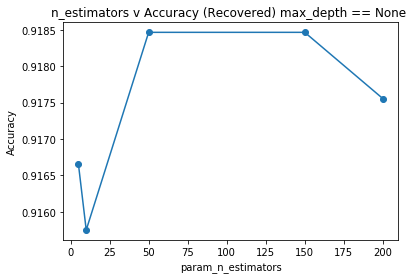

15    0.916656
16    0.915751
17    0.918466
18    0.918466
19    0.917557
Name: mean_test_score, dtype: float64

In [234]:
plt.plot(df_parameters_recovered_temp['param_n_estimators'].values,df_parameters_recovered_temp['mean_test_score'].values,marker='o')
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("n_estimators v Accuracy (Recovered) max_depth == None ")
plt.show()
df_parameters_recovered_temp['mean_test_score']

### Best Parameter param_max_depth=3 param_n_estimators=50

In [235]:
clf = GradientBoostingClassifier(max_depth=3, n_estimators=50)

clf.fit(x_train,y_train)        
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9420289855072463
AUC 0.9286363636363636
f1score 0.9555555555555557


In [236]:
from joblib import dump, load
dump(clf, 'clf_GBC_Recovered.joblib') 

['clf_GBC_Recovered.joblib']

In [237]:
df_interpretability_recovered.loc['Gradient Tree Boosting', 'Accuracy'] = accuracy
df_interpretability_recovered.loc['Gradient Tree Boosting', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_recovered.loc['Gradient Tree Boosting', 'F1-Score'] = f_score
df_interpretability_recovered;

---

In [238]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Confirmed
### PCA Dataset

In [239]:
principalDf_confirmed

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Confirmed
0,-0.431465,0.082818,-1.661292,-0.201435,-0.013455,0.737704,0.768388,-0.132842,0
1,-1.550358,-1.979677,0.649273,-0.574587,0.020091,0.415600,-0.486661,0.017412,0
2,-2.301140,-1.121563,-0.304790,1.057181,-0.610970,0.032155,0.770779,-0.274926,0
3,1.815730,0.482667,-0.716085,-0.070677,0.072204,-0.546974,-0.086859,-0.230141,0
4,-1.101464,0.570996,0.084535,1.325279,-0.788552,-0.392544,0.469734,0.422414,0
...,...,...,...,...,...,...,...,...,...
2653,2.997519,0.390033,0.199291,0.565574,0.126321,-0.442187,0.080831,0.284324,1
2654,-3.244259,-3.490947,0.144486,2.419162,7.419693,-1.770442,0.119618,0.045246,1
2655,-3.163800,-0.662700,0.406605,0.895961,-0.664225,0.193336,0.762179,0.161723,1
2656,0.138422,0.375773,-1.919768,-1.127991,0.080792,-0.346849,-0.370958,0.222745,1


In [240]:
x_confirmed_pca = principalDf_confirmed.loc[:, features].values
y_confirmed_pca = principalDf_confirmed.loc[:,['Confirmed']].values

In [241]:
arr = np.array(y_confirmed_pca)
y_confirmed_pca_newarr = arr.reshape(y_confirmed_pca.shape[0],)
y_confirmed_pca_newarr.shape

(2658,)

In [242]:
x_train,x_test,y_train,y_test=train_test_split(x_confirmed_pca, y_confirmed_pca_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(GradientBoostingClassifier(random_state=0),{'n_estimators':[5 ,10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_confirmed, y_confirmed_newarr)
df_parameters_confirmed_pca = pd.DataFrame(clf.cv_results_)
df_parameters_confirmed_pca[['param_n_estimators','mean_test_score','rank_test_score']]

,param_n_estimators,mean_test_score,rank_test_score
0,5,0.877343,5
1,10,0.904069,4
2,50,0.947335,3
3,150,0.979689,2
4,200,0.984202,1


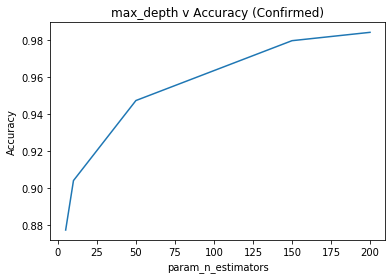

In [243]:
plt.plot(df_parameters_confirmed_pca['param_n_estimators'].values,df_parameters_confirmed_pca['mean_test_score'].values)
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("max_depth v Accuracy (Confirmed)")
plt.show()

### Best Parameters param_n_estimators=200

In [244]:
clf = GradientBoostingClassifier(random_state=0, n_estimators=200 )
clf.fit(x_train,y_train)
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.981203007518797
AUC 0.9811320754716981
f1score 0.9807692307692307


In [245]:
from joblib import dump, load
dump(clf, 'clf_GBC_Confirmed_PCA.joblib') 

['clf_GBC_Confirmed_PCA.joblib']

In [246]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Deaths
### PCA Dataset

In [247]:
principalDf_deaths

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Deaths
0,0.838112,-0.640460,-1.694588,-0.606326,0.176650,0.401679,0.494965,0.127632,0
1,-0.123620,-0.784851,-2.479154,3.266583,0.056047,-1.158585,0.046412,0.093545,0
2,1.148847,-0.925947,-0.561029,-0.214984,-0.189991,-0.863490,-0.236859,-0.472061,0
3,-2.081615,0.268763,-0.396155,-0.048793,0.154611,0.271165,-0.152859,-0.313796,0
4,-4.024722,1.785172,1.915059,1.529074,-0.400143,0.185418,-0.305218,0.471326,0
...,...,...,...,...,...,...,...,...,...
2483,1.636210,0.083945,-0.581247,-0.161640,-0.246242,0.480883,0.851232,0.705197,1
2484,-2.297366,0.692852,1.688806,-1.286980,0.464598,-1.114342,0.413956,-0.444035,1
2485,1.130214,-0.890072,-0.545995,-0.234658,-0.170437,-0.867257,-0.233095,-0.442134,1
2486,3.609240,-1.155160,1.067420,-0.198400,-0.191529,-0.856245,-1.803927,0.140194,1


In [248]:

x_deaths_pca = principalDf_deaths.loc[:, features].values
y_deaths_pca = principalDf_deaths.loc[:,['Deaths']].values

In [249]:
arr = np.array(y_deaths_pca)
y_deaths_pca_newarr = arr.reshape(y_deaths_pca.shape[0],)
y_deaths_pca_newarr.shape

(2488,)

In [250]:
x_train,x_test,y_train,y_test=train_test_split(x_deaths_pca, y_deaths_pca_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(GradientBoostingClassifier(random_state=0),{'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
df_parameters_deaths_pca = pd.DataFrame(clf.cv_results_)
df_parameters_deaths_pca[['param_n_estimators','mean_test_score','rank_test_score']]

,param_n_estimators,mean_test_score,rank_test_score
0,5,0.811558,5
1,10,0.832161,4
2,50,0.887437,3
3,150,0.926131,2
4,200,0.934673,1


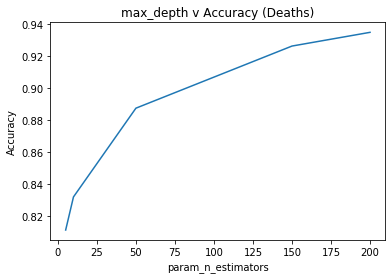

In [251]:
plt.plot(df_parameters_deaths_pca['param_n_estimators'].values,df_parameters_deaths_pca['mean_test_score'].values)
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("max_depth v Accuracy (Deaths)")
plt.show()

### Best Parameters param_n_estimators=200

In [252]:
clf = GradientBoostingClassifier(random_state=0, n_estimators=200 )
clf.fit(x_train,y_train)
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9377510040160643
AUC 0.939114152892562
f1score 0.9363449691991788


In [253]:
from joblib import dump, load
dump(clf, 'clf_GBC_Deaths_PCA.joblib') 

['clf_GBC_Deaths_PCA.joblib']

In [254]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Recovered
### PCA Dataset

In [255]:
principalDf_recovered

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Recovered
0,0.167289,-0.202046,-2.123755,-0.389615,0.279090,-0.300402,0.255593,0.134441,0
1,-4.792232,1.593028,3.945457,1.752560,-1.045291,0.054170,0.162663,-0.637015,0
2,-0.328110,1.133464,-1.277333,0.449386,0.396552,0.371481,-0.731861,0.020160,1
3,-0.463401,-0.359201,-1.191848,-0.345832,0.172995,0.222039,-0.084106,0.369486,1
4,4.516027,6.171078,1.154601,1.408415,-0.075265,-0.668954,0.226275,-0.052008,0
...,...,...,...,...,...,...,...,...,...
1375,-0.357129,-1.682012,0.613557,0.833157,-2.019286,-0.308802,0.850615,1.044129,1
1376,0.809592,0.124127,-0.808299,0.107912,-0.385922,-0.786765,0.481422,-0.305651,1
1377,-0.457245,-0.850883,-0.068361,-0.272373,-0.282510,0.214476,0.277300,0.430069,1
1378,-0.814127,0.335684,0.795745,-1.049347,0.381291,-0.440125,0.519021,-0.533402,1


In [256]:
x_recovered_pca = principalDf_recovered.loc[:, features].values
y_recovered_pca = principalDf_recovered.loc[:,['Recovered']].values

In [257]:
arr = np.array(y_recovered_pca)
y_recovered_pca_newarr = arr.reshape(y_recovered_pca.shape[0],)
y_recovered_pca_newarr.shape

(1380,)

In [258]:
x_train,x_test,y_train,y_test=train_test_split(x_recovered_pca, y_recovered_pca_newarr, test_size=0.2, random_state=98)
clf = GridSearchCV(GradientBoostingClassifier(random_state=0),{'n_estimators':[5, 10, 50, 150, 200]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
df_parameters_recovered_pca = pd.DataFrame(clf.cv_results_)
df_parameters_recovered_pca[['param_n_estimators','mean_test_score','rank_test_score']]

,param_n_estimators,mean_test_score,rank_test_score
0,5,0.778980,5
1,10,0.866833,4
2,50,0.930222,1
3,150,0.922982,2
4,200,0.921176,3


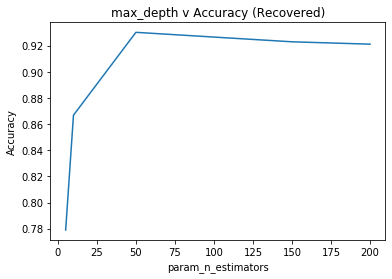

In [259]:
plt.plot(df_parameters_recovered_pca['param_n_estimators'].values,df_parameters_recovered_pca['mean_test_score'].values)
plt.xlabel("param_n_estimators")
plt.ylabel("Accuracy")
plt.title("max_depth v Accuracy (Recovered)")
plt.show()

### Best Parameters param_n_estimators=150

In [260]:
clf = GradientBoostingClassifier(random_state=0, n_estimators=150 )
clf.fit(x_train,y_train)
y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.9202898550724637
AUC 0.91375
f1score 0.9375


In [261]:
from joblib import dump, load
dump(clf, 'clf_GBC_Recovered_PCA.joblib') 

clf = load('clf_GBC_Recovered_PCA.joblib') 
y_test_predicted=clf.predict(x_test)
y_test_predicted

array([1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0])

#### On implementing Gradient Boosting classifier using various parameters for the number of trees and maximum depth of trees. For target 'Confirmed' the maximum validation accuracy on the best parameter for normal dataset(number of trees=null) is 98.40 but for PCA dataset it is 98.42. Incase of 'Death' dataset accurac for normal is 95.52 for PCA is 93.46. The validation accuracy for 'Recovered' Dataset is 91.4 for normal dataset and 93.02 for PCA dataset. The general trend that can be seen is that the PCA helps us to get a better accuracy score as compared to gradient boosting on Normal dataset, a reason for this can be that PCA by reducing the number of features reduces overfitting.

In [262]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# CM6 Naive Bayes
## Confirmed
### Normal Dataset

In [263]:
x_train,x_test,y_train,y_test=train_test_split(x_confirmed, y_confirmed_newarr, test_size=0.2, random_state=98)
NB=GaussianNB()
clf = GridSearchCV(NB,{'var_smoothing':[1e-10, 1e-9, 1e-5, 1e-3, 1e-1]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
df_parameters_confirmed = pd.DataFrame(clf.cv_results_)
df_parameters_confirmed[['param_var_smoothing','mean_test_score','rank_test_score']]

,param_var_smoothing,mean_test_score,rank_test_score
0,1e-10,0.676401,1
1,1e-09,0.676401,1
2,1e-05,0.675932,3
3,0.001,0.610064,4
4,0.1,0.559262,5


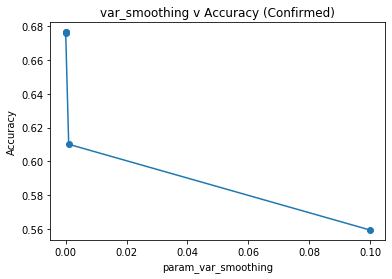

In [307]:
plt.plot(df_parameters_confirmed['param_var_smoothing'].values,df_parameters_confirmed['mean_test_score'].values,marker='o')
plt.xlabel("param_var_smoothing")
plt.ylabel("Accuracy")
plt.title("var_smoothing v Accuracy (Confirmed)")
plt.show()

<p>As we increase the value of 'var_smoothing' for the first two values i.e 1e-10 and 1e-09 the mean_test_score remains the same at .67 and then it follows a linear decrement trend, when the value of var_smoothing parameter is 0.1 its mean_test_score decreases to .55</p>

In [308]:
clf=GaussianNB(var_smoothing=1e-10)
clf.fit(x_train,y_train)

y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.7065217391304348
AUC 0.6252272727272727
f1score 0.7999999999999998


In [309]:
from joblib import dump, load
dump(clf, 'clf_NB_Confirmed.joblib') 

['clf_NB_Confirmed.joblib']

In [310]:
df_interpretability_confirmed.loc['Naive Bayes', 'Accuracy'] = accuracy
df_interpretability_confirmed.loc['Naive Bayes', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_confirmed.loc['Naive Bayes', 'F1-Score'] = f_score

---

In [311]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Deaths
### Normal Dataset

In [312]:
x_train,x_test,y_train,y_test=train_test_split(x_deaths, y_deaths_newarr, test_size=0.2, random_state=98)
NB=GaussianNB()
clf = GridSearchCV(NB,{'var_smoothing':[1e-10, 1e-9, 1e-5, 1e-3, 1e-1]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
df_parameters_deaths = pd.DataFrame(clf.cv_results_)
df_parameters_deaths[['param_var_smoothing','mean_test_score','rank_test_score']]

,param_var_smoothing,mean_test_score,rank_test_score
0,1e-10,0.650754,1
1,1e-09,0.650754,1
2,1e-05,0.650754,1
3,0.001,0.643216,5
4,0.1,0.645226,4


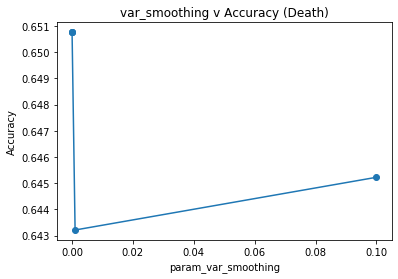

In [313]:
plt.plot(df_parameters_deaths['param_var_smoothing'].values,df_parameters_deaths['mean_test_score'].values,marker='o')
plt.xlabel("param_var_smoothing")
plt.ylabel("Accuracy")
plt.title("var_smoothing v Accuracy (Death)")
plt.show()

<p>As we increase the value of 'var_smoothing' for the first three values i.e 1e-10, 1e-09 and 1e-05 the mean_test_score remains the same at .65 and then it decreases, when the value of var_smoothing parameter is 0.1 its mean_test_score decreases to .64</p>

In [314]:
clf=GaussianNB(var_smoothing=1e-10)
clf.fit(x_train,y_train)

y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.6666666666666666
AUC 0.6718265754132232
f1score 0.6009615384615384


In [315]:
from joblib import dump, load
dump(clf, 'clf_NB_Deaths.joblib') 

['clf_NB_Deaths.joblib']

In [316]:
df_interpretability_deaths.loc['Naive Bayes', 'Accuracy'] = accuracy
df_interpretability_deaths.loc['Naive Bayes', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_deaths.loc['Naive Bayes', 'F1-Score'] = f_score
df_interpretability_deaths

,Accuracy,AUC,F1-Score
Decision Trees Classifier,0.959839,0.960938,0.95935
Random Forest Classifier,0.957831,0.958984,0.95723
Gradient Tree Boosting,0.959839,0.960938,0.95935
Naive Bayes,0.666667,0.671827,0.600962


---

In [317]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

## Recovered
### Normal Dataset

In [318]:
from sklearn.ensemble import GradientBoostingClassifier
x_train,x_test,y_train,y_test=train_test_split(x_recovered, y_recovered_newarr, test_size=0.2, random_state=98)
NB=GaussianNB()
clf = GridSearchCV(NB,{'var_smoothing':[1e-10, 1e-9, 1e-5, 1e-3, 1e-1]},
                   cv=5, return_train_score=False)
clf.fit(x_train, y_train)
df_parameters_recovered = pd.DataFrame(clf.cv_results_)
df_parameters_recovered[['param_var_smoothing','mean_test_score','rank_test_score']]

,param_var_smoothing,mean_test_score,rank_test_score
0,1e-10,0.709243,2
1,1e-09,0.709243,2
2,1e-05,0.709243,2
3,0.001,0.723723,1
4,0.1,0.642217,5


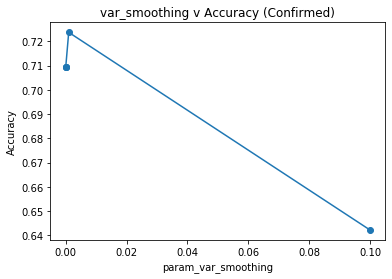

In [319]:
plt.plot(df_parameters_recovered['param_var_smoothing'].values,df_parameters_recovered['mean_test_score'].values,marker='o')
plt.xlabel("param_var_smoothing")
plt.ylabel("Accuracy")
plt.title("var_smoothing v Accuracy (Confirmed)")
plt.show()

<p>As we increase the value of 'var_smoothing' for the first three values i.e 1e-10, 1e-09 and 1e-05 the mean_test_score remains the same at .70 and then it increases to .72 for 0.001 and finally when the value of var_smoothing parameter is 0.1 its mean_test_score decreases to .64</p>

In [302]:
clf=GaussianNB(var_smoothing=0.001)
clf.fit(x_train,y_train)

y_test_predicted=clf.predict(x_test)
accuracy=accuracy_score(y_test,y_test_predicted)
f_score = f1_score(y_test,y_test_predicted)
print(f"Accuracy {accuracy}")
print(f"AUC {roc_auc_score(y_test,y_test_predicted)}")
print(f"f1score {f_score}")

Accuracy 0.7210144927536232
AUC 0.6365909090909091
f1score 0.8117359413202935


In [303]:
from joblib import dump, load
dump(clf, 'clf_NB_Recovered.joblib') 

['clf_NB_Recovered.joblib']

In [304]:
df_interpretability_recovered.loc['Naive Bayes', 'Accuracy'] = accuracy
df_interpretability_recovered.loc['Naive Bayes', 'AUC'] = roc_auc_score(y_test,y_test_predicted)
df_interpretability_recovered.loc['Naive Bayes', 'F1-Score'] = f_score
df_interpretability_recovered

,Accuracy,AUC,F1-Score
Decision Trees Classifier,0.894928,0.883068,0.91831
Random Forest Classifier,0.927536,0.917273,0.94382
Gradient Tree Boosting,0.942029,0.928636,0.955556
Naive Bayes,0.721014,0.636591,0.811736


### Impact of var_smoothing parameter

<p>"var_smoothing" parameter has different impact on different kind of dataset. By tuning the value of "var_smoothing", we add a user defined value to the gaussian distribution variance that our model is using. This helps us to account for more samples that are further away from the mean of distribution by widdening the curve. In our case when we increase the value of var_smoothing the accuracy of model linearly increase or decrease depending upon the value of the artificially added value. </p>

---
---

In [281]:
display(Latex(r"\newpage"));

<IPython.core.display.Latex object>

# CM7 Interpretability
## Finding the Performance of NB compared to the decision tree approaches
<p> 
We will use the Normal dataset as mentioned in the question. To compare the metrics we will evaluate the performace of the various approches like F1-Score, AUC, Accuracy. All the evaluation was performed on the test set.

Note: These values were calculated in their respective Questions/CM.See Above. 
</p>



<p>In general it is seen that the performance of the naive bayes model is worst as compared to the other models for all the three target datasets.</p> 

In [282]:
print("Comparing Confirmed Dataset using different approaches")
df_interpretability_confirmed

Comparing Confirmed Dataset using different approaches


,Accuracy,AUC,F1-Score
Decision Trees Classifier,0.984962,0.984906,0.984674
Random Forest Classifier,0.969925,0.969811,0.968872
Gradient Tree Boosting,0.984962,0.984906,0.984674
Naive Bayes,0.654135,0.652929,0.488889


<p> For the confirmed label the best approach interms of the results shown above is the 'Decision tree' and 'Gradient Tree Boosting'. It has the highest Accuracy, AUC and F1-Score. The worst method is the Naive Bayes which performs the worst.</p>

In [283]:
print("Comparing Deaths Dataset using different approaches")
df_interpretability_deaths

Comparing Deaths Dataset using different approaches


,Accuracy,AUC,F1-Score
Decision Trees Classifier,0.959839,0.960938,0.95935
Random Forest Classifier,0.957831,0.958984,0.95723
Gradient Tree Boosting,0.959839,0.960938,0.95935
Naive Bayes,0.662651,0.66792,0.594203


<p> For the Deaths label the best approach in terms of the results, as shown above, is the 'Decision tree' and 'Gradient Boosting Classifier'. It has the highest Accuracy, AUC and F1-Score. The worst method is the Naive Bayes which performs the worst.</p>

In [284]:
print("Comparing Recovered Dataset using different approaches")
df_interpretability_recovered

Comparing Recovered Dataset using different approaches


,Accuracy,AUC,F1-Score
Decision Trees Classifier,0.894928,0.883068,0.91831
Random Forest Classifier,0.927536,0.917273,0.94382
Gradient Tree Boosting,0.942029,0.928636,0.955556
Naive Bayes,0.721014,0.636591,0.811736


<p> For the Recovered label the best approach in terms of the results, as shown above,  'Gradient Tree Boosting'. Both offer the same Results. They have the highest Accuracy, AUC and F1-Score. The worst method is the Naive Bayes which performs the worst.</p>